# Import packages, open data

In [50]:
import h5py
import seaborn as sns
from datetime import datetime
#from skimage.io import imsave
import openpyxl
import numpy as np
import matplotlib.pyplot as plt
#%plt.style.use("v_paper")
import pandas as pd
from scipy.io import loadmat
from scipy.io import savemat
%matplotlib inline
import seaborn as sns
import statsmodels.formula.api as smf
import re
from statsmodels.stats.anova import anova_lm
import os
import os.path
#import statsmodels.api as smapi
import sys
import warnings
from sklearn.linear_model import LinearRegression
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import seaborn as sns
import statsmodels as sm
import scipy
from pathlib import Path
from itertools import chain
from scipy import optimize
from sklearn.cluster import KMeans

In [51]:
plt.rcParams['axes.facecolor'] = 'white'

In [52]:
def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

# Anatomical regions

In [53]:
Regionsdf=pd.read_pickle("Regionsdf.pkl")

In [54]:
NameList=sorted(Regionsdf['RegionNames'].unique())

In [55]:
T87_75=loadmat('C:\\Users\\Soso\Documents\GitHub\FlyLFM\MatlabFiles\CompareConditions\87to75.mat')['VarName3']

In [56]:
Regionsdf=Regionsdf.query('FR>15')

In [57]:
GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
Regionsdf=Regionsdf.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')

Corronoff200=np.zeros((GoodICFiles.shape[0],41,201))
Corroff200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],41))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,41,201))
Trials=np.zeros((GoodICFiles.shape[0],41))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(41)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    #try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            if (GoodICFiles.iloc[i]['RegionFile']!=''):
                TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

                #TS=loadmat(GoodICFiles.iloc[i]['RegionFile'])['TS']
            #TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            else:
                continue
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T    
                
            print(Regressor.shape, TS.shape)   
            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]                 
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
                
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]     


            
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-0.5*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    
                    if len(TS)==87:
                        TS2=TS
                        TS=np.zeros((75,TS.shape[1]))
                        for j in range(75):
                            TS[j,:]=TS2[T87_75[j][0]-1,:]  
                    
                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        
                        Corronoff200[i,NameList.index(RegName),:]=Corronoff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        ## fit onset
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        residuals = Corrloc50- piecewise_linear(x50, *p)
                        ss_res = np.sum(residuals**2)
                        ss_tot = np.sum((Corrloc50-np.mean(Corrloc50))**2)
                        r_squared = 1 - (ss_res / ss_tot)
                        
                        Corron200[i,NameList.index(RegName),:]=Corron200[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j),'OnTime']=p[0]
                        
                        if r_squared>0.9:
                            Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]+p[0]
                        
                        if j==20:
                            print(r_squared)
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[NameList.index(RegName)]+l),NameList.index(RegName),:]=Tlocint(xnew)
  
                            if j==20:
                                plt.plot(x,(Tloc-Tloc[0])*10)
                                plt.axvline(x=p[0])
                                xd = np.linspace(-1, 1, 100)
                                plt.plot(xd, piecewise_linear(xd, *p))
                        plt.show()   
                        k[NameList.index(RegName)]=k[NameList.index(RegName)]+sum(Ron)
                        Trials[i,NameList.index(RegName)]=sum(Ron) 
                        
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        Corroff200[i,NameList.index(RegName),:]=Corroff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                del TS
                
   # except:
      #   continue   


Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('PANFuncRegionsCorron200Time_sup15Hz.npy',Corron200Time)
np.save('PANFunRegionsCorron200_sup15Hz.npy',Corron200)

NameError: name 'GoodICFiles' is not defined

In [58]:
Corron200Time=np.load('PANCorron200Time_sup15Hz.npy')
Corron200=np.load('PANCorron200_sup15Hz.npy')

Corron200Time[Corron200Time==0]=np.nan

plt.plot(np.nanmean(Corron200Time,axis=0))
plt.plot(np.nanstd(Corron200Time,axis=0))
#plt.xlabel(NamesList)

FileNotFoundError: [Errno 2] No such file or directory: 'PANCorron200Time_sup15Hz.npy'

In [17]:
Corron200n=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),41,201))
FRs=np.zeros((GoodICFiles.shape[0],87))

# Plot all trials
CorrOn=np.zeros((41,201))
fig, axs = plt.subplots(6, 8,figsize=(25,15))
for j in range(41):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:])
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

(array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 1.],
        [1., 1., 0., ..., 0., 0., 0.],
        [2., 0., 0., ..., 0., 0., 0.]]),
 array([-1.        , -0.96360033, -0.92720066, -0.89080099, -0.85440132,
        -0.81800165, -0.78160198, -0.74520231, -0.70880264, -0.67240297,
        -0.6360033 , -0.59960363, -0.56320396, -0.52680429, -0.49040462,
        -0.45400495, -0.41760528, -0.38120561, -0.34480594, -0.30840627,
        -0.2720066 , -0.23560693, -0.19920726, -0.16280759, -0.12640792,
        -0.09000825, -0.05360858, -0.01720891,  0.01919076,  0.05559043,
         0.0919901 ,  0.12838977,  0.16478944,  0.20118911,  0.23758878,
         0.27398845,  0.31038812,  0.34678779,  0.38318746,  0.41958713,
         0.4559868 ,  0.49238647,  0.52878614,  0.56518581,  0.60158548,
         0.63798515,  0.67438482,  0.71078449,  0.74718417,  0.78358384,
         0.81998351])

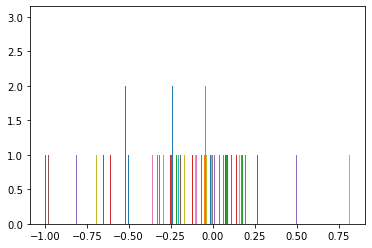

In [19]:
plt.hist(Corron200Time,50)
#plt.xlim(-0.1,0.1)

In [20]:
CorronPAN=np.zeros((41,201,GoodICFiles.shape[0]))

fig, axs = plt.subplots(6, 8,figsize=(20,18))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        for j in range(41):
            if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                CorronPAN[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                k[j]=k[j]+1
plt.show()  

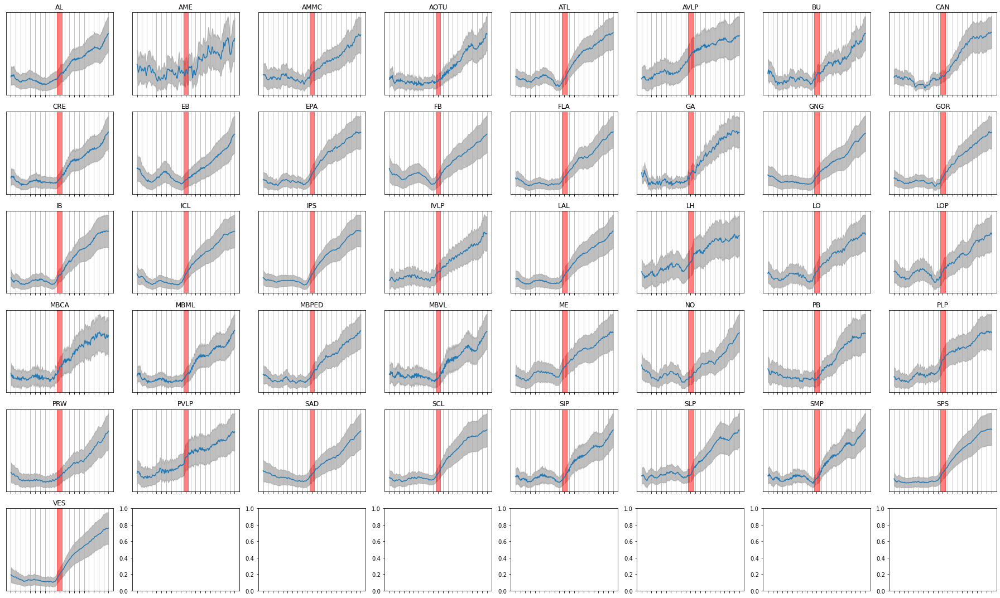

In [33]:
# Plot trial average
CorrOn=np.zeros((41,201))
d=8
fig, axs = plt.subplots(6,d,figsize=(25,15),sharex=True)
l=0
for j in range(41):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.png')
plt.show() 


In [81]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")

GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000
#Regionsdf=Regionsdf.query('FR>15')
#Compdf=Compdf.query('FR>15')
#GoodICFiles=GoodICFiles.query('FR>15')

In [82]:
GoodICFiles[np.isnan(GoodICFiles['FR'])==False]['expID'].unique()

array(['216', '100761', '100762', '103', '104', '105', '100106', 'B34',
       'B35', 'B36', 'B37', 'B38', 'B39', 'B40', 'B41', 'B42', 'B43',
       'B180', 'B182', 'B183', 'B184', 'B190', 'B192', 'B193', 'B194',
       'B195', 'B196', 'B197', '100148', '100234', '100609', '981',
       'B322', 'B323', '100133', 'B993', 'B1037', 'B1047', '247', '249',
       '251', '359', '360', '369', '370', '371', '372', 'B1070', 'B1125',
       'B1126', 'B1128', 'B1129', '100160', 'B1073', 'B1075', 'B1080',
       'B1090', 'B754', 'B66', 'B68', 'B70', 'B73', 'B74', 'B75', 'B99',
       'B100', 'B167', 'B168', 'B169', 'B175', 'B176', 'B177', 'B116',
       'B117', 'B118', 'B126', 'B127', 'B128', 'B129', 'B153', 'B154',
       'B130', 'B131', 'B132', 'B133', 'B134', 'B140', 'B141', 'B1134',
       '107', '100142', '100145', '100455', '100597', '100621', 'B370',
       'B373', 'B378', '46', '47', 'B765', 'B766', 'B767', 'B768',
       'B1054', '29', '158', '167', 'B361', 'B362', '194', 'B97', 'B122',
 

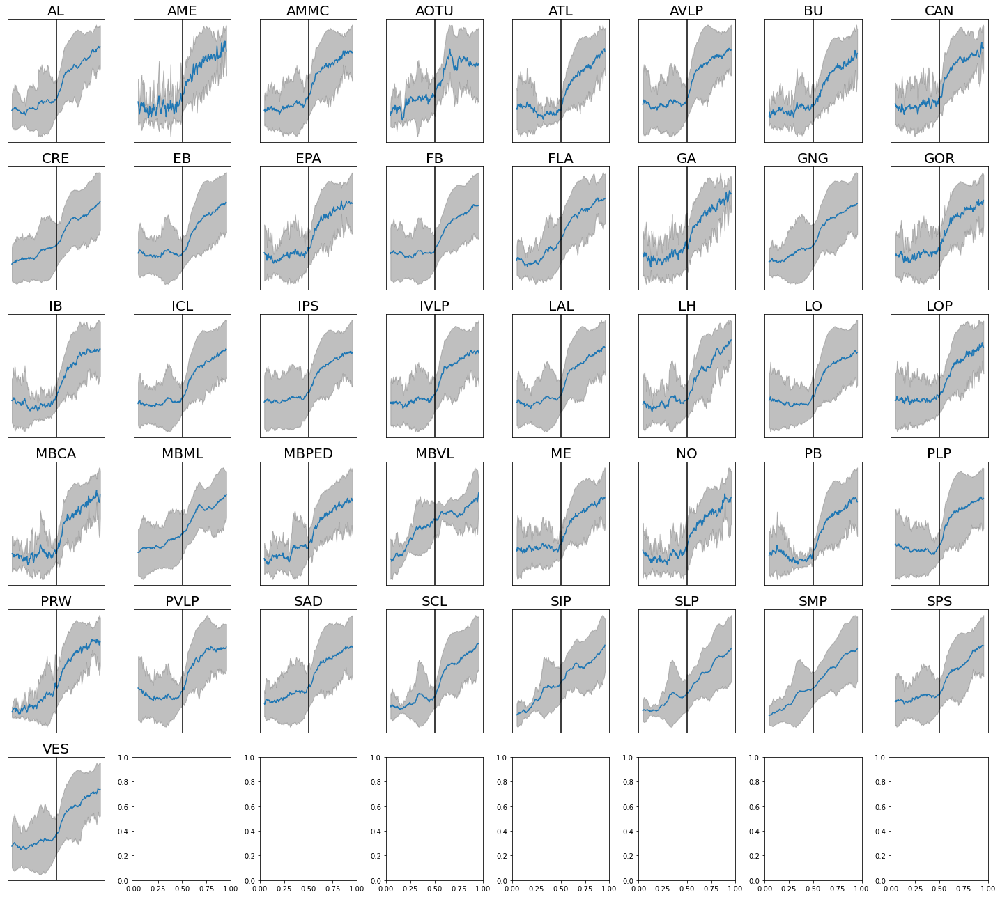

In [27]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTH[j,:,:],axis=1))
    err=np.nanstd(CorronTH[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100, color='black')
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTH[j,:,:],axis=1)-err, np.nanmean(CorronTH[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronTH_sup20Hz.svg')
plt.show()  

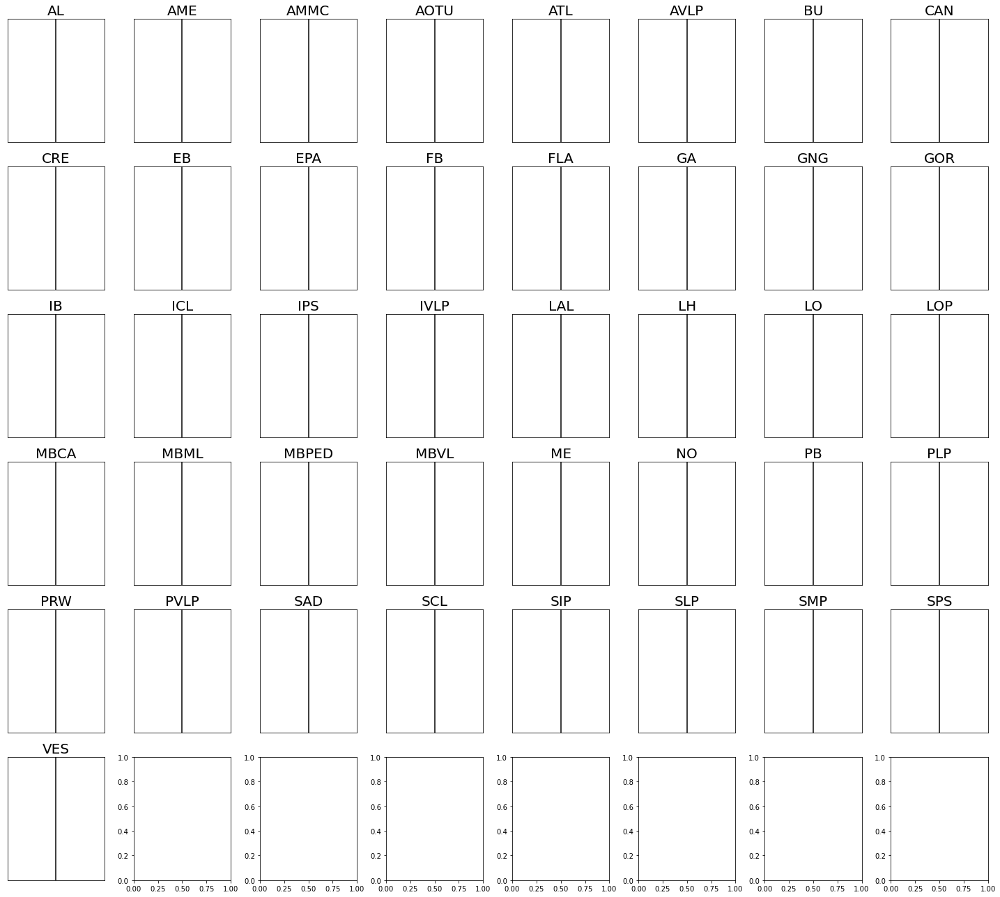

In [28]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTDC[j,:,:],axis=1))
    err=np.nanstd(CorronTDC[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100, color='black')
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTDC[j,:,:],axis=1)-err, np.nanmean(CorronTDC[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronTDC_sup20Hz.svg')
plt.show()  

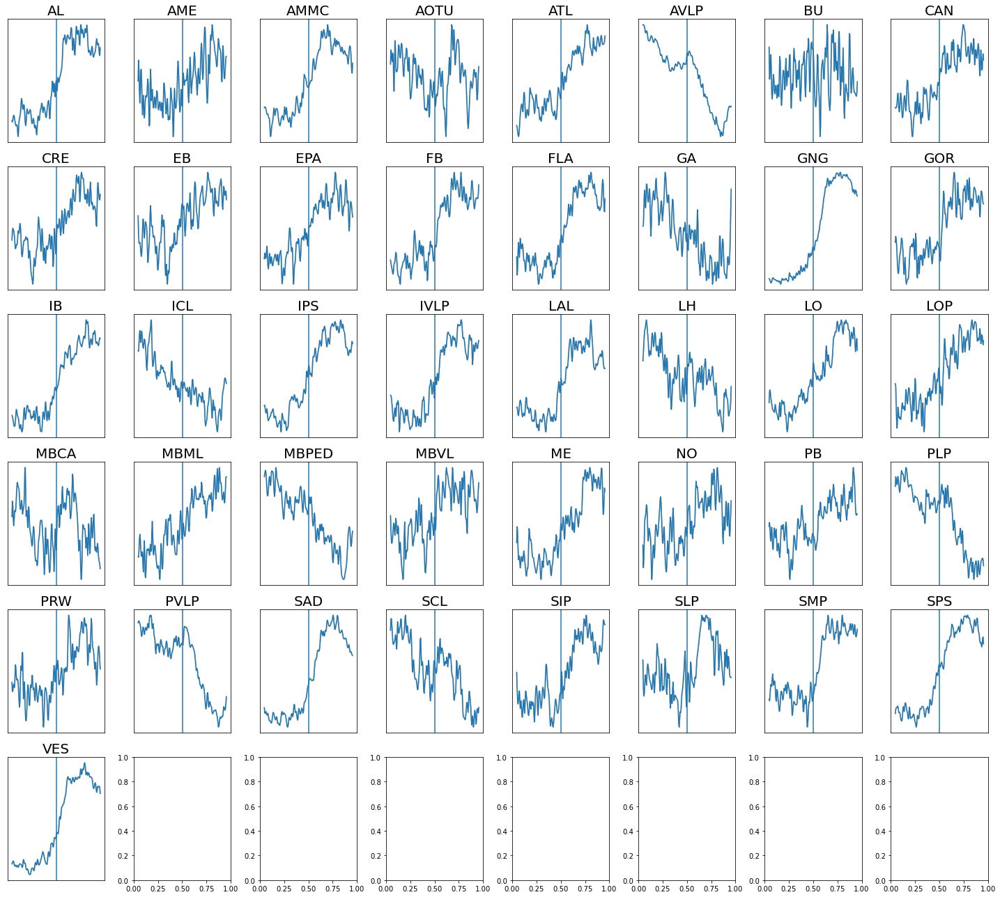

In [29]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTrh[j,:,:],axis=1))
    err=np.nanstd(CorronTrh[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTrh[j,:,:],axis=1)-err, np.nanmean(CorronTrh[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronTrh_sup20Hz.svg')
plt.show()  

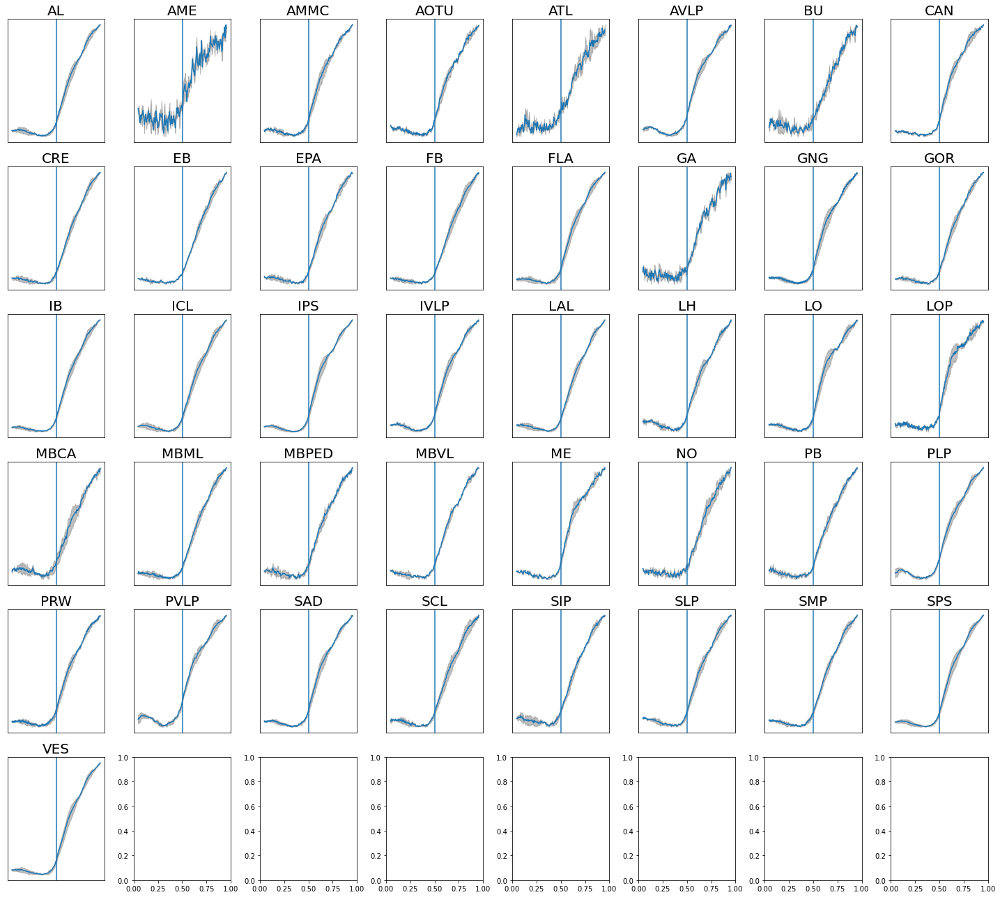

In [30]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronGad[j,:,:],axis=1))
    err=np.nanstd(CorronGad[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronGad[j,:,:],axis=1)-err, np.nanmean(CorronGad[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronGad_sup20Hz.svg')
plt.tight_layout()
plt.show()  

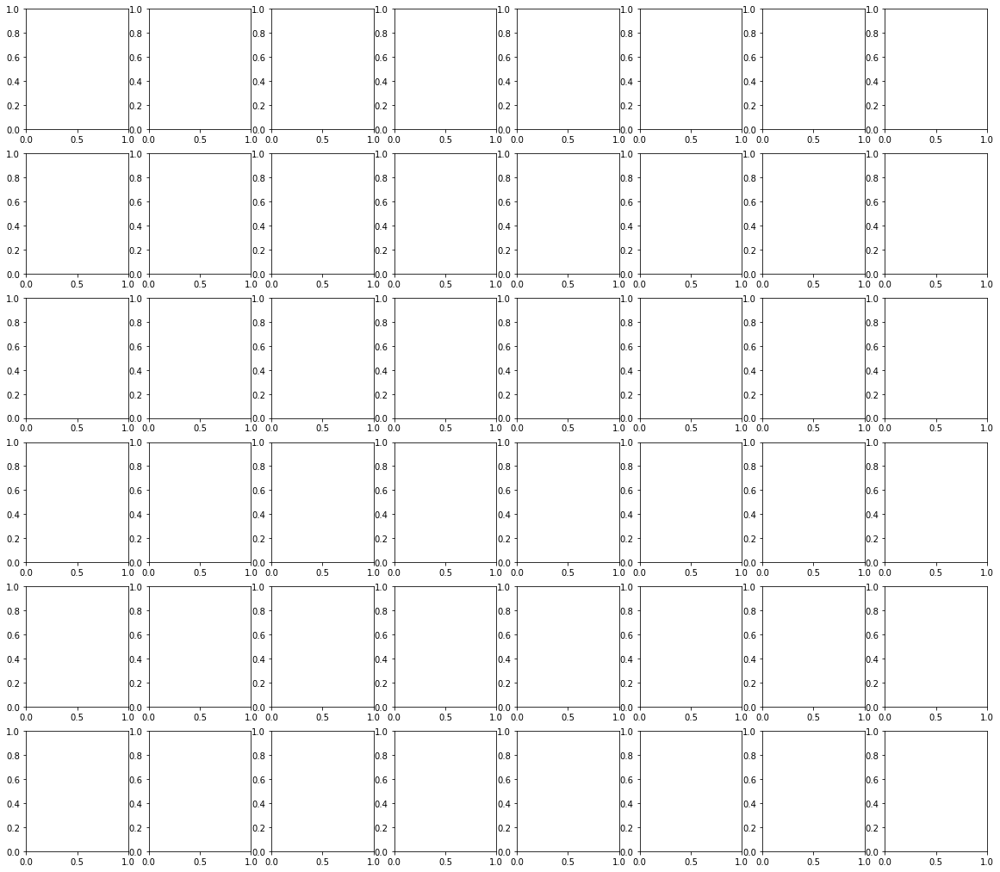

In [31]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
CorronCha=np.zeros((41,200,GoodICFiles.shape[0]))
CorronCha[:,:,:]=np.nan
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        if (GoodICFiles.iloc[i]['GAL4'] == 'Cha') :
            for j in range(41):
                if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                    CorronCha[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                    k[j]=k[j]+1
plt.show()  

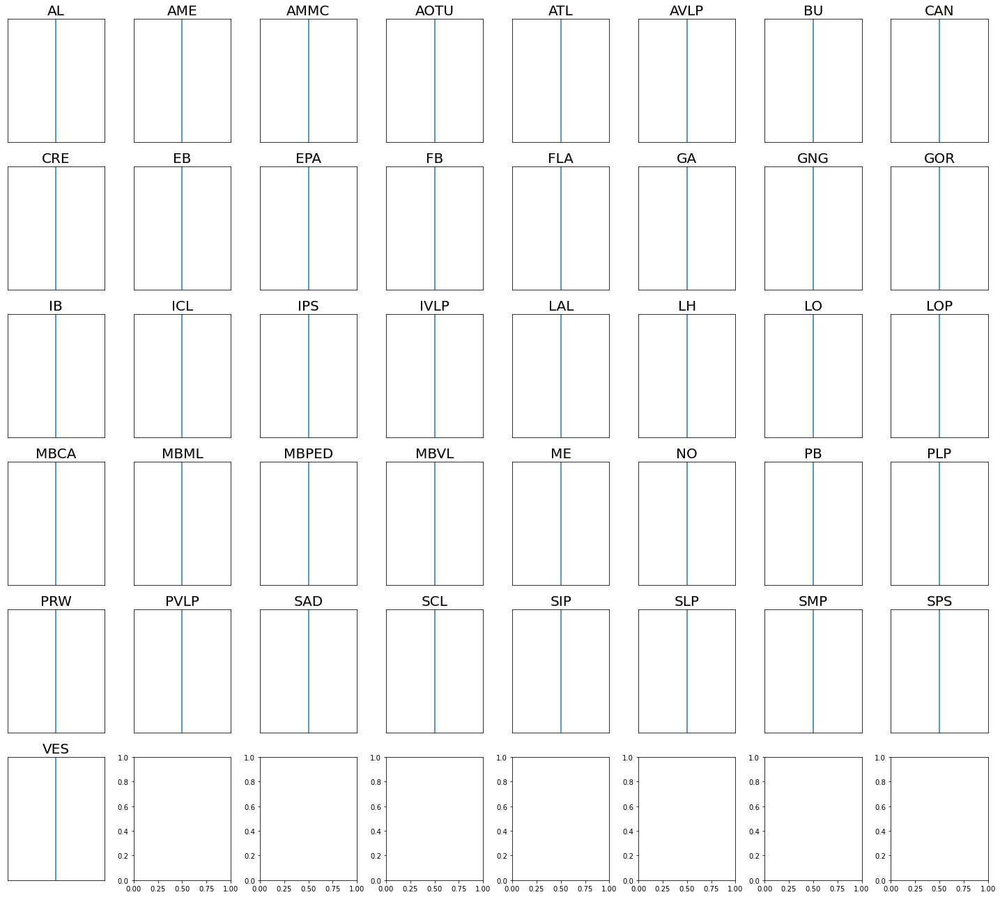

In [32]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronCha[j,:,:],axis=1))
    err=np.nanstd(CorronCha[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronCha[j,:,:],axis=1)-err, np.nanmean(CorronCha[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronCha_sup20Hz.svg')
plt.show()  

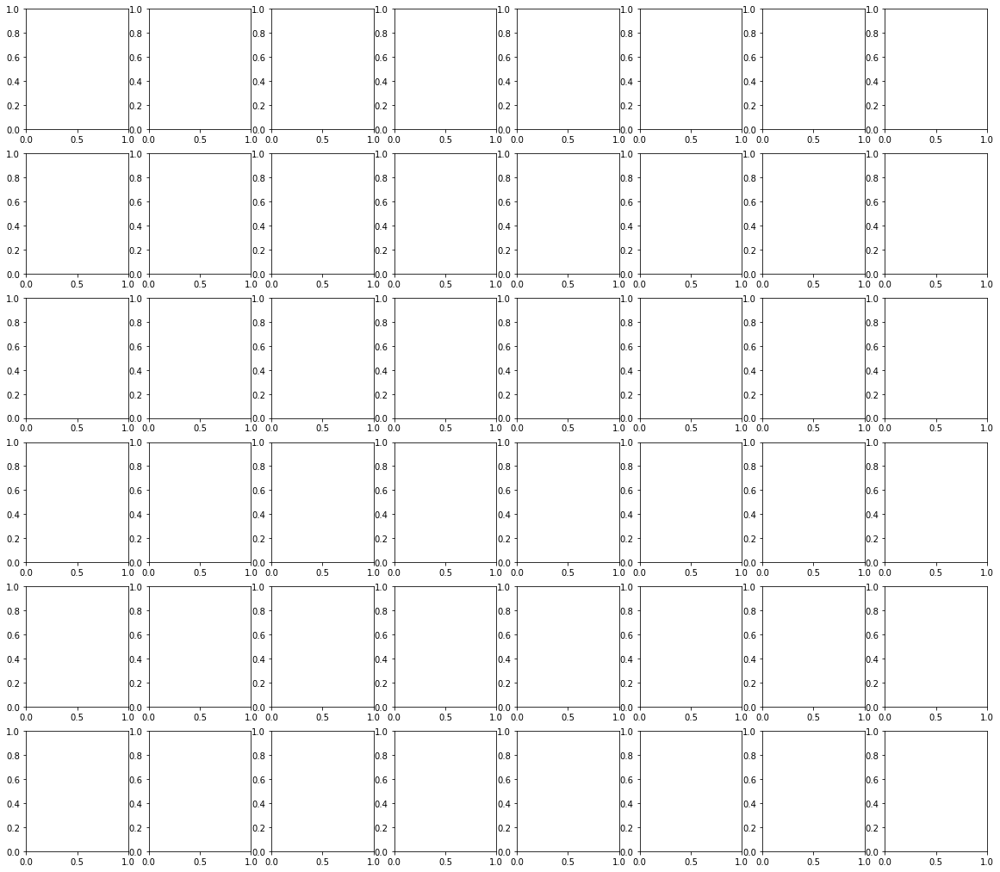

In [33]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
CorronVglut=np.zeros((41,200,GoodICFiles.shape[0]))
CorronVglut[:,:,:]=np.nan
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        if (GoodICFiles.iloc[i]['GAL4'] == 'Vglut') :
            for j in range(41):
                if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                    CorronVglut[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                    k[j]=k[j]+1
plt.show()  

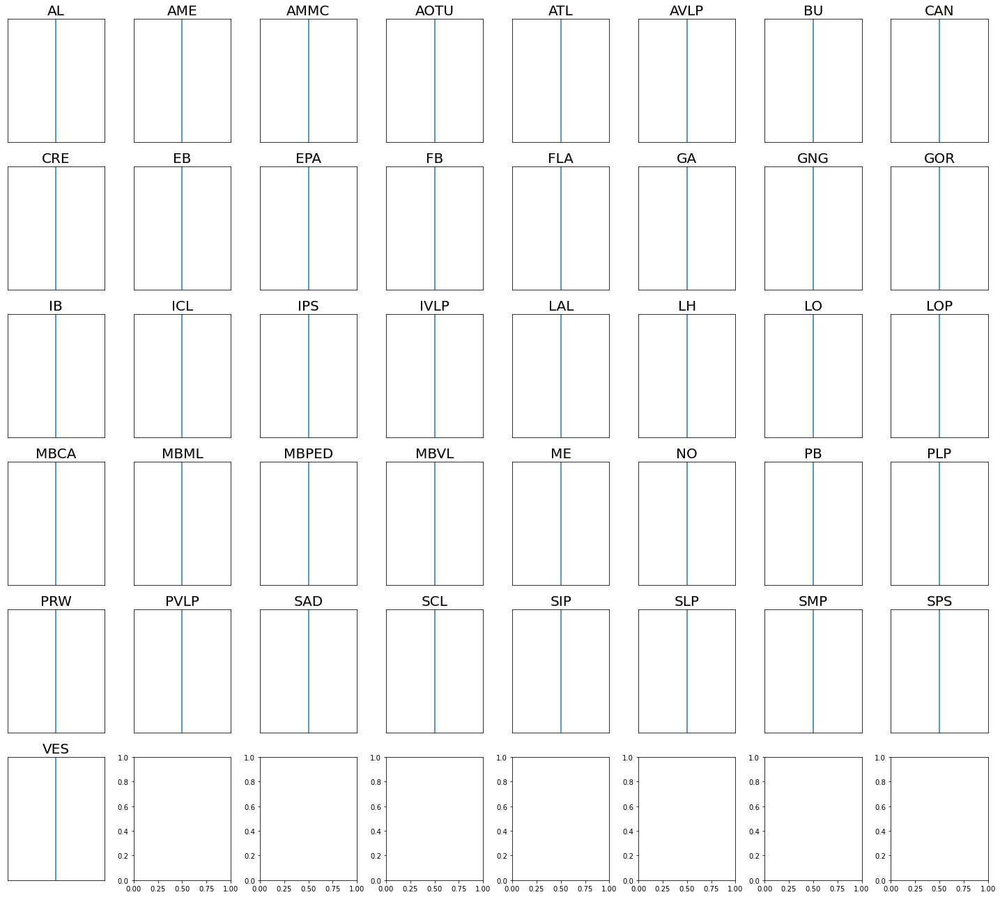

In [34]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronVglut[j,:,:],axis=1))
    err=np.nanstd(CorronVglut[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronVglut[j,:,:],axis=1)-err, np.nanmean(CorronVglut[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\CorronVglut_sup20Hz.svg')
plt.show()  

In [ ]:
DeltaTime=np.zeros((271,41))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
    for j in range(41):
        DeltaTime[i,j]=Corron200Time[i,j]-Corron200Time[i,14]
    if np.mean(DeltaTime[i,j])<0:
        print(GoodICFiles.iloc[i]['GAL4'])
DeltaTime[DeltaTime==0]=np.nan        
plt.hist(DeltaTime)

# Components

In [59]:
Compdf=pd.read_pickle("Compdf.pkl")
GoodICFiles=pd.read_pickle("GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Regionsdf.pkl")
CompOrder=pd.read_csv('AllCompIDOrderedVF.txt',header=None)

In [60]:
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==55,'FR']=50
GoodICFiles.loc[GoodICFiles.index==62,'FR']=20
GoodICFiles.loc[GoodICFiles.index==66,'FR']=20
GoodICFiles.loc[GoodICFiles.index==68,'FR']=20
GoodICFiles.loc[GoodICFiles.index==71,'TSlowlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==71,'TShighlimWalk']=5999
GoodICFiles.loc[GoodICFiles.index==71,'FR']=10
GoodICFiles.loc[GoodICFiles.index==72,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==72,'TShighlimWalk']=2000
GoodICFiles.loc[GoodICFiles.index==72,'FR']=10
GoodICFiles.loc[GoodICFiles.index==73,'FR']=5
GoodICFiles.loc[GoodICFiles.index==75,'FR']=10
GoodICFiles.loc[GoodICFiles.index==76,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==88,'FR']=10
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=500

GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==167,'FR']=100
GoodICFiles.loc[GoodICFiles.index==168,'FR']=100
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==181,'WalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B369-B380\\Fly1\\B378_1_500Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==192,'FR']=10
GoodICFiles.loc[GoodICFiles.index==199,'ForcedWalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B361-B362-forced\\B362_1_950Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==199,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==199,'TShighlimWalk']=950
GoodICFiles.loc[GoodICFiles.index==213,'FR']=50
GoodICFiles.loc[GoodICFiles.index==217,'FR']=5
GoodICFiles.loc[GoodICFiles.index==220,'FR']=5
GoodICFiles.loc[GoodICFiles.index==221,'FR']=200
GoodICFiles.loc[GoodICFiles.index==222,'FR']=10
GoodICFiles.loc[GoodICFiles.index==223,'FR']=10
GoodICFiles.loc[GoodICFiles.index==224,'FR']=10
GoodICFiles.loc[GoodICFiles.index==225,'FR']=10

GoodICFiles.loc[GoodICFiles.index==228,'TSlowlimWalk']=250
GoodICFiles.loc[GoodICFiles.index==228,'TShighlimWalk']=250+1719
GoodICFiles.loc[GoodICFiles.index==228,'FR']=5
GoodICFiles.loc[GoodICFiles.index==230,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==230,'TShighlimWalk']=1500

GoodICFiles.loc[GoodICFiles.index==233,'TSlowlimWalk']=1474
GoodICFiles.loc[GoodICFiles.index==233,'TShighlimWalk']=2800
GoodICFiles.loc[GoodICFiles.index==235,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==235,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==247,'FR']=5
GoodICFiles.loc[GoodICFiles.index==255,'FR']=5
GoodICFiles.loc[GoodICFiles.index==256,'TSlowlimWalk']=650
GoodICFiles.loc[GoodICFiles.index==256,'TShighlimWalk']=1950
GoodICFiles.loc[GoodICFiles.index==256,'FR']=5
GoodICFiles.loc[GoodICFiles.index==260,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==260,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==260,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'TSlowlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==261,'TShighlimWalk']=1035
GoodICFiles.loc[GoodICFiles.index==262,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==262,'TShighlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==262,'FR']=5



In [39]:
for i in range(GoodICFiles.shape[0]):
#for i in range(228,229):
#for i in range(262,GoodICFiles.shape[0]):
    try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])          
            
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)

            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print(Regressor.shape[0])                 
            
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]               

 
            
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]      
                
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print(Regressor.shape[0])                  
                

            FR=GoodICFiles.iloc[i]['FR']
            print(FR)
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                print(GoodICFiles.iloc[i]['expID'])

                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(2*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-2*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+FR)])>0.4):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.4):
                        Roff[m+1]=1                    


                savemat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'),{"Ron": Ron, "Roff": Roff})


   # except:
      #   continue   
                    # Regress here, cross corr...

/media/NAS/Sophie/WalkProject/TDC/B700-B703/DataB700ss1regon240TS.mat
6000
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B700-B703\B700Walkkd100-3100kd.mat
(3001, 1)
/media/NAS/Sophie/WalkProject/TDC/B700-B703/DataB700ss1regon240TS.mat
6000
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B700-B703\B700Walkkd100-3100kd.mat
3001
/media/NAS/Sophie/WalkProject/TDC/B700-B703/DataB700ss1regon240TS.mat
3001
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B700-B703\B700Walkkd100-3100kd.mat
3001
5.0
B700
/media/NAS/Sophie/WalkProject/TDC/B1250-54/DataB1252ss1reg112TS.mat
2466
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B1250-54\B1252_400_1670Walkkd.mat
(1271, 1)
/media/NAS/Sophie/WalkProject/TDC/B1250-54/DataB1252ss1reg112TS.mat
2466
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B1250-54\B1252_400_1670Walkkd.mat
1271
/media/NAS/Sophie/WalkProject/TDC/B1250-54/DataB1252ss1reg112TS.mat
1271
Z:\GrunwaldKadow_group\Sophie\WalkProject\TDC\B1250-54\B1252_400_1670Walkkd.mat
1271
5.0
B1252
/media/NAS/Sop

# Get single trials Components

In [5]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [6]:
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==55,'FR']=50
GoodICFiles.loc[GoodICFiles.index==62,'FR']=20
GoodICFiles.loc[GoodICFiles.index==66,'FR']=20
GoodICFiles.loc[GoodICFiles.index==68,'FR']=20
GoodICFiles.loc[GoodICFiles.index==71,'TSlowlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==71,'TShighlimWalk']=5999
GoodICFiles.loc[GoodICFiles.index==71,'FR']=10
GoodICFiles.loc[GoodICFiles.index==72,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==72,'TShighlimWalk']=2000
GoodICFiles.loc[GoodICFiles.index==72,'FR']=10
GoodICFiles.loc[GoodICFiles.index==73,'FR']=5
GoodICFiles.loc[GoodICFiles.index==75,'FR']=10
GoodICFiles.loc[GoodICFiles.index==76,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==88,'FR']=10
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==167,'FR']=100
GoodICFiles.loc[GoodICFiles.index==168,'FR']=100
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==181,'WalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B369-B380\\Fly1\\B378_1_500Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==192,'FR']=10
GoodICFiles.loc[GoodICFiles.index==199,'ForcedWalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B361-B362-forced\\B362_1_950Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==199,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==199,'TShighlimWalk']=950
GoodICFiles.loc[GoodICFiles.index==213,'FR']=50
GoodICFiles.loc[GoodICFiles.index==217,'FR']=5
GoodICFiles.loc[GoodICFiles.index==220,'FR']=5
GoodICFiles.loc[GoodICFiles.index==221,'FR']=200
GoodICFiles.loc[GoodICFiles.index==222,'FR']=10
GoodICFiles.loc[GoodICFiles.index==223,'FR']=10
GoodICFiles.loc[GoodICFiles.index==224,'FR']=10
GoodICFiles.loc[GoodICFiles.index==225,'FR']=10
GoodICFiles.loc[GoodICFiles.index==228,'TSlowlimWalk']=250
GoodICFiles.loc[GoodICFiles.index==228,'TShighlimWalk']=250+1719
GoodICFiles.loc[GoodICFiles.index==228,'FR']=5
GoodICFiles.loc[GoodICFiles.index==230,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==230,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==233,'TSlowlimWalk']=1474
GoodICFiles.loc[GoodICFiles.index==233,'TShighlimWalk']=2800
GoodICFiles.loc[GoodICFiles.index==235,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==235,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==247,'FR']=5
GoodICFiles.loc[GoodICFiles.index==255,'FR']=5
GoodICFiles.loc[GoodICFiles.index==256,'TSlowlimWalk']=650
GoodICFiles.loc[GoodICFiles.index==256,'TShighlimWalk']=1950
GoodICFiles.loc[GoodICFiles.index==256,'FR']=5
GoodICFiles.loc[GoodICFiles.index==260,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==260,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==260,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'TSlowlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==261,'TShighlimWalk']=1035
GoodICFiles.loc[GoodICFiles.index==262,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==262,'TShighlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==262,'FR']=5

In [7]:
CompCorronoff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorroff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200Time=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [8]:
CompCorron200Trials=np.zeros((10000,len(CompOrder),201))
FRTrials=np.zeros((10000,len(CompOrder)))
GAL4Trials=np.zeros((10000,len(CompOrder)))
FlyIDTrials=np.zeros((10000,len(CompOrder)))
GAL4num = {np.nan:0,'Nsyb':1, 'GMR57C10':1, 'Cha':2, 'Vglut':3, 'Gad':4, 'TH':5, 'Trh':6, 'TDC':7}  
UASTrials=np.zeros((10000,len(CompOrder)))
UASnum={np.nan:0,'7f':1, '6f':2, '6m':3,'7s' :4, '6s':5, 'syt6s':6}
CompCorron200Trials[:,:,:]=np.nan
xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(300)
Trials=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
nFlies=np.zeros(len(CompOrder))
kall=0

In [9]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")

In [ ]:
#GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
#Regionsdf=Regionsdf.query('GAL4 == "TH"')
#for i in range(164,GoodICFiles.shape[0]):
for i in range(GoodICFiles.shape[0]):
#for i in range(93):
    try:
        FR=GoodICFiles.iloc[i]['FR']
        if GoodICFiles.iloc[i]['WalkRegressor'] != '' and GoodICFiles.iloc[i]['GAL4'] != 'Vglut' and GoodICFiles.iloc[i]['GAL4'] != 'Gad' and GoodICFiles.iloc[i]['GAL4'] != 'Cha':
            print(i)
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            Ron =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'))['Ron'].T
            Roff =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'))['Roff'].T
            Regressor=Ron
            
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            if not np.isnan(GoodICFiles.iloc[i]['TSlowlimWalk']): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]                  
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]  
            if TS.shape[1]!=(Regressor.shape[0]):
                TS=TS[:,2:TS.shape[1]-1]                 

            Ron=Regressor
    
            for j in range(TS.shape[0]):
                #print(len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])))                
                if len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID']))!=0:
                    RegName=list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])[0]
                                                            
                    #print(CompOrder[CompOrder[0]==RegName])    
                    #if (np.isnan(np.mean(TS[j,:]))==False) and (CompOrder[CompOrder[0]==RegName].empty == False):
                    if (CompOrder[CompOrder[0]==RegName].empty == False):                        
                        #print(RegName)
#                         ## Full correlation
#                             TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
#                             Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)

                        ## Onset correlation
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T),'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')      

                        ## fit onset to get onset time
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        #p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)                            
                        #Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),'OnTime']=p[0]
                       #CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+p[0]

                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR)+1]
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            CompCorron200Trials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0],:]=Tlocint(xnew)
                            FRTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=FR
                            GAL4Trials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=GAL4num[GoodICFiles.iloc[i]['GAL4']]
                            UASTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=UASnum[GoodICFiles.iloc[i]['UAS']]
                            FlyIDTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=int(GoodICFiles.iloc[i]['FlyID'])                           
                        #k[list(CompOrder[CompOrder[0]==RegName].index)[0]]= k[list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)
                        Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)   
                        nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]=nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]+1
                        
                        
            del TS
              

    except:
        continue   
                    # Regress here, cross corr...

0
3
4
8
9
11
13
14
15
16
17
18
19
20
21
22
24
25
26
29
30
31
32
33
41
42
44
45
50
53


In [ ]:
hf = h5py.File('Trials2spre_noChaGadVglut.h5', 'w')
hf.create_dataset('CompCorron200', data=CompCorron200)
hf.create_dataset('CompCorroff200', data=CompCorroff200)
hf.create_dataset('CompCorronoff200', data=CompCorronoff200)
hf.create_dataset('kall', data=kall)
hf.create_dataset('Trials', data=Trials)
hf.create_dataset('CompCorron200Trials', data=CompCorron200Trials)
hf.create_dataset('NComponents', data=nFlies)
hf.create_dataset('FRTrials', data=FRTrials)
hf.create_dataset('GAL4Trials', data=GAL4Trials)
hf.create_dataset('UASTrials', data=UASTrials)
hf.create_dataset('FlyIDTrials', data=FlyIDTrials)
hf.close()

In [17]:
FlyIDTrials.shape

(10000, 89)

# Plot all trial

In [62]:
hf = h5py.File('C:\\Users\Soso\Desktop\FlyStuff\Aimon2022\Fig6Data\Trials2spre.h5', 'r')
CompCorron200=hf.get('CompCorron200')[:]
CompCorroff200=hf.get('CompCorroff200')[:]
CompCorronoff200=hf.get('CompCorronoff200')[:]
kall=hf.get('kall')[()]
Trials=hf.get('Trials')[:]
CompCorron200Trials=hf.get('CompCorron200Trials')[:]
nFlies=hf.get('NComponents')[:]
FRTrials=hf.get('FRTrials')[:]
GAL4Trials=hf.get('GAL4Trials')[:]
UASTrials=hf.get('UASTrials')[:]
FlyIDTrials=hf.get('FlyIDTrials')[:]
hf.close()

In [63]:
CompOrder=pd.read_csv('AllCompIDOrderedVF.txt',header=None)

In [64]:
np.max(FRTrials)

100.0

In [65]:
FlyIDTrials.shape

(10000, 89)

In [66]:
#CompCorron200n=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
#FRs=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [67]:
Trials.shape

(271, 89)

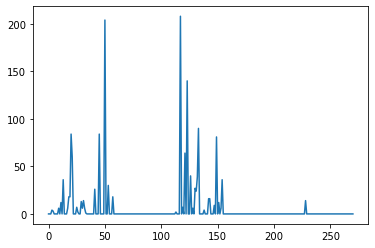

In [68]:
plt.plot(Trials[:,3])

In [69]:
CompCorron200Trials.shape

(10000, 89, 201)

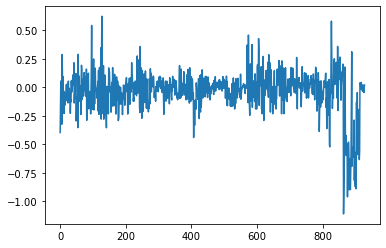

In [70]:
plt.plot(CompCorron200Trials[:,5,5])

In [71]:
CompCorron200[np.isnan(CompCorron200)]=0

In [72]:
CompCorron200Trialn=np.zeros((CompCorron200Trials.shape))

In [73]:
CompOrder[0][22]

'CL?'

In [74]:
CompOrder[0][22]='CLint'

In [75]:
GAL4Trials.shape

(10000, 89)

In [76]:
UASnum={np.nan:0,'7f':1, '6f':2, '6m':3,'7s' :4, '6s':5, 'syt6s':6}

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88


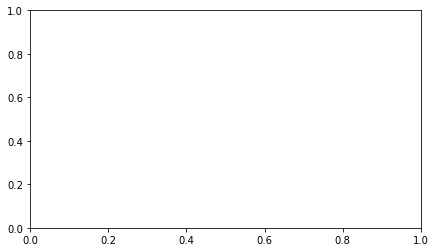

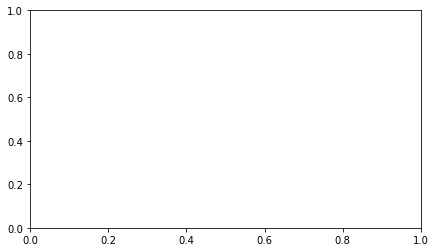

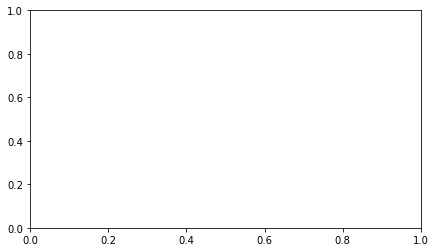

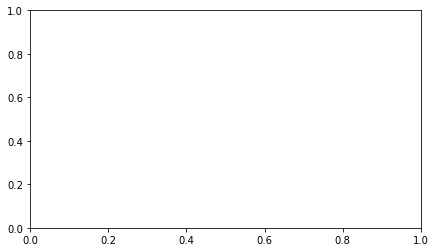

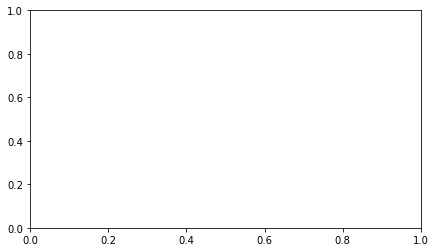

...

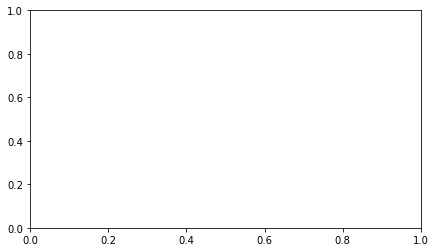

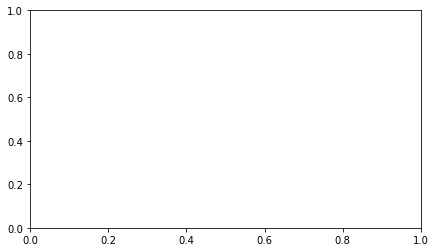

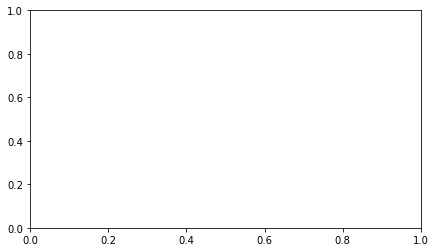

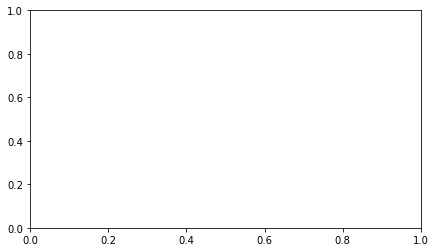

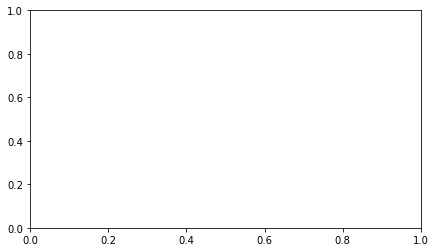

In [77]:
# Plot all trials
CompCorrOn=np.zeros((len(CompOrder),201))

j=0
#j=23
for l in range(len(CompOrder)):
#for l in range(26,30):
    print(l)
    if sum(Trials[:,l])>3:
        fig, axs = plt.subplots(1, 1,figsize=(7,4))
        for k in range(10000):
            C=CompCorron200Trials[k,l,:]
            if (np.nanmax(C)-np.nanmin(C))!=0 and FRTrials[k,l]<=20:
                CompCorron200Trialn[k,l,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
                #plt.plot(C-np.mean(C[0:5]),alpha=0.1,c=[GAL4Trials[k,l]/7,np.abs(0.5-GAL4Trials[k,l]/7),1-GAL4Trials[k,l]/7])
#         plt.title(CompOrder[0][l]) 
#         #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
#         plt.axvspan(100-30, 100+30,color='grey',alpha=0.2)
#         #plt.get_yaxis().set_visible(False)
#         plt.ylim([-0.7,0.7])
#         j=j+1
        
#         plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.png')
#         plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.svg')
#         plt.show()
#    except:
  #       continue   

#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials_AllFreq_1sbeforeOlfSS.svg')


In [39]:
Regionsdf=pd.read_pickle("Regionsdf.pkl")
df1=Regionsdf[Regionsdf['R2Walk']>0].query('GAL4=="Nsyb" or GAL4=="GMR57C10"')
result = smf.ols(formula="CoefWalk ~ UAS", data=df1).fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               CoefWalk   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     12.78
Date:                Fri, 28 Oct 2022   Prob (F-statistic):           2.82e-10
Time:                        13:03:24   Log-Likelihood:                 1015.1
No. Observations:                2099   AIC:                            -2020.
Df Residuals:                    2094   BIC:                            -1992.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1581      0.010     15.878      0.000       0.139       0.178
UAS[T.6m]      0.0219      0.011      2.034      0.042       0.001       0.043
UAS[T.6s]      0.0618      0.013      4.689      0.000       0.036       0.088
UAS[T.7f]     -0.0620      0.020     -3.129      0.002      -0.101      -0.023
UAS[T.7s]      0.0344      0.016      2.186      0.029       0.004       0.065
==============================================================================
Omnibus:                      529.216   Durbin-Watson:                   0.871
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1376.629
Skew:                           1.338   Prob(JB):                    1.17e-299
Kurtosis:                       5.929   Cond. No.                         9.43
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [41]:
result.params

Intercept    0.158102
UAS[T.6m]    0.021881
UAS[T.6s]    0.061817
UAS[T.7f]   -0.062014
UAS[T.7s]    0.034417
dtype: float64

In [1]:
UAScor={0:1,1:(0.158102-0.062014)/0.158102, 2:1, 3:(0.158102+0.021881)/0.158102,4:(0.034417+0.158102)/0.158102, 5:(0.061817+0.158102)/0.158102, 6:(0.061817+0.158102)/0.158102}

In [ ]:
UASnum={np.nan:0,'7f':1, '6f':2, '6m':3,'7s' :4, '6s':5, 'syt6s':6}

In [9]:
UAScor[6]

1.3909944213229433

In [45]:
UAScor[UASTrials[k,l]]

1.3909944213229433

In [12]:
# # Plot all trials
# CompCorrOn=np.zeros((len(CompOrder),201))

# j=0
# #j=23
# for l in range(len(CompOrder)):
# #for l in range(26,30):
#     print(l)
#     if sum(Trials[:,l])>3:
#         fig, axs = plt.subplots(1, 1,figsize=(5,5))
#         for k in range(10000):
#             C=CompCorron200Trials[k,l,:]
#             if (np.nanmax(C)-np.nanmin(C))!=0 and FRTrials[k,l]<=20:
#                 CompCorron200Trialn[k,l,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
#                 plt.plot(UAScor[UASTrials[k,l]]*(C-np.mean(C[0:5])),alpha=0.1,c=[GAL4Trials[k,l]/7,np.abs(0.5-GAL4Trials[k,l]/7),1-GAL4Trials[k,l]/7])
#         plt.title(CompOrder[0][l]) 
#         #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
#         plt.axvspan(100-30, 100+30,color='grey',alpha=0.2)
#         axs.set_yticks([0])
#         axs.set_yticklabels([])  
#         axs.set_xticks([])  
#         axs.yaxis.grid()
#         plt.ylim([-0.8,0.8])
#         plt.xlim([5,195])
#         j=j+1
    
#         plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.png')
#         plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.svg')
#         plt.show()
#    except:
  #       continue   

#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials_AllFreq_1sbeforeOlfSS.svg')


In [ ]:
fig, axs = plt.subplots(10, 8,figsize=(20,40),sharex=True)
# Plot all trials
CompCorrOn=np.zeros((len(CompOrder),201))

j=0
#j=23
for l in range(len(CompOrder)):
#for l in range(26,30):
    #print(l)
    if sum(Trials[:,l])>3:
        fig, axs = plt.subplots(1, 1,figsize=(5,5))
        for k in range(10000):
            C=CompCorron200Trials[k,l,:]
            if (np.nanmax(C)-np.nanmin(C))!=0 and FRTrials[k,l]<=20:
                CompCorron200Trialn[k,l,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
                axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(UAScor[UASTrials[k,l]]*(C-np.mean(C[0:5])),alpha=0.1,c=[GAL4Trials[k,l]/7,np.abs(0.5-GAL4Trials[k,l]/7),1-GAL4Trials[k,l]/7])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].title(CompOrder[0][l]) 
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)]t.axvspan(100-30, 100+30,color='grey',alpha=0.2)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_yticks([0])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_yticklabels([])  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([])  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].yaxis.grid()
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].ylim([-0.8,0.8])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xlim([5,195])
        j=j+1
    
        #plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.png')
        #plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\CorronComponentsAllTrials2sbefore_'+CompOrder[0][l]+'.svg')
        
#    except:
  #       continue   

plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials.png')
plt.show()

SyntaxError: invalid syntax (Temp/ipykernel_42792/3001082546.py, line 19)

In [132]:
np.save('CompCorron200Trialn20Hzlow.npy',CompCorron200Trialn)

# Plot summaries

In [78]:
CompOrder=pd.read_csv('AllCompIDOrderedVF.txt',header=None)
CompCorron200Trialn=np.load('C://Users//Soso//Desktop/FlyStuff/Aimon2022\\Fig6Data\CompCorron200Trialn.npy')
hf = h5py.File('C:\\Users\\Soso\\Desktop\\FlyStuff\Aimon2022\\Fig6Data\Trials2spre.h5', 'r')
CompCorron200=hf.get('CompCorron200')[:]
CompCorroff200=hf.get('CompCorroff200')[:]
CompCorronoff200=hf.get('CompCorronoff200')[:]
kall=hf.get('kall')[()]
Trials=hf.get('Trials')[:]
CompCorron200Trials=hf.get('CompCorron200Trials')[:]
nFlies=hf.get('NComponents')[:]
FRTrials=hf.get('FRTrials')[:]
GAL4Trials=hf.get('GAL4Trials')[:]
UASTrials=hf.get('UASTrials')[:]
hf.close()

In [79]:
Trials.shape

(271, 89)

In [80]:
GAL4num = {np.nan:0,'Nsyb':1, 'GMR57C10':1, 'Cha':2, 'Vglut':3, 'Gad':4, 'TH':5, 'Trh':6, 'TDC':7}  

In [81]:
CompCorron200Trialn[np.mean(CompCorron200Trialn)==0,:,:]=np.nan

In [82]:
CompCorron200Trialn.shape

(10000, 89, 201)

In [83]:
FRTrials.shape

(10000, 89)

In [84]:
import statsmodels.stats.multitest as multi; 

In [85]:
pval=np.zeros(60)
k=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)

    if sum(Trials[:,j])>3 and len(np.unique(FlyIDTrials[Condition1,j]))>=3:
        print(CompOrder[0][j])
        C0=CompCorron200Trialn[:,j,:]
        C=np.sum(C0[Condition1,50:100].T-C0[Condition1,50],0)
        pval[k]=scipy.stats.wilcoxon(C,alternative="greater").pvalue
        print(pval[k])
        k=k+1

AL
0.9841761813183821
PN
0.9999266871742222
MultiGl
0.6562206561223177
PNv
0.998419884018024
PN-KC
0.9950949890275793
KCab
0.41974474162628767
KCapbp
0.7643841000236177
KCg
0.5629202129903366
Beta1Betap1
0.5545540866093297
Beta2Betap2
0.8927859639135289
Gamma1
0.5010745967928327
Gamma2
0.41605198569605645
Gamma3
0.20599079132080078
Gamma4
0.8594407169684247
Gamma5
0.9028245097622163
Alpha2
0.8004688698610302
Alpha3
0.6582129043939613
Alphap3
0.8713760375976562
CLvert
0.033270409510953274
CL
0.9986523623265459
SMPm
0.04891264306454284
SMPl-SIP
0.045302519089968546
SIP-FB
0.39095306396484375
SLP-SMPproj
0.8715228486033457
SLP
0.28462516069283406
FBcol
0.019682518048983202
FBlayv
0.30946708942215023
FBlaym
0.596957059757816
FBlayd
0.01528177794453933
PBfull
0.009784607616923197
PB-DA
0.0016759998109321592
PB-EB
0.9947924295805223
EB
0.09526309426583879
EB-DA
0.0878445034881632
ATL
0.07133900678007637
M-Omega
0.00039582033340056173
SPS
0.29517155952007346
IPS-Y
2.064801268954342e-10
LAL-PS

In [86]:
k=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)

    if sum(Trials[:,j])>3 and len(np.unique(FlyIDTrials[Condition1,j]))>=3:
        print(CompOrder[0][j])
        print(multi.multipletests(pval,0.01,method='fdr_by')[1][k])
        k=k+1

AL
1.0
PN
1.0
MultiGl
1.0
PNv
1.0
PN-KC
1.0
KCab
1.0
KCapbp
1.0
KCg
1.0
Beta1Betap1
1.0
Beta2Betap2
1.0
Gamma1
1.0
Gamma2
1.0
Gamma3
1.0
Gamma4
1.0
Gamma5
1.0
Alpha2
1.0
Alpha3
1.0
Alphap3
1.0
CLvert
0.6672908789875641
CL
1.0
SMPm
0.8583931166138363
SMPl-SIP
0.8480396748853002
SIP-FB
1.0
SLP-SMPproj
1.0
SLP
1.0
FBcol
0.4251306178607309
FBlayv
1.0
FBlaym
1.0
FBlayd
0.35758370229974007
PBfull
0.249767431029715
PB-DA
0.05882596445470588
PB-EB
1.0
EB
1.0
EB-DA
1.0
ATL
1.0
M-Omega
0.015877610289651265
SPS
1.0
IPS-Y
5.7978014203227764e-08
LAL-PS
0.0006297718170461847
PPM2-LW
1.3203350780586844e-05
PPM2-VI
0.0017123978746379823
AMMC-PLP
1.0
AMMC-WE
1.0
WE-DA
0.0007364069157953612
AVLPprojm
1.0
AVLPm
1.0
AVLPshell
1.0
VLPl
1.0
PI
1.0
PI-PRW
1.0
PRW
1.0
PRW-SLP
1.0
GNGm
1.0
GNGml
1.0
vaCells
1.0
OL
1.0
OL-FB
0.18524101552983044
OL-PENP
0.16982644188829887
OL-PLP
1.0
OL-WE
1.649869391928283e-05


In [34]:
k

60

In [36]:
# correct fly number

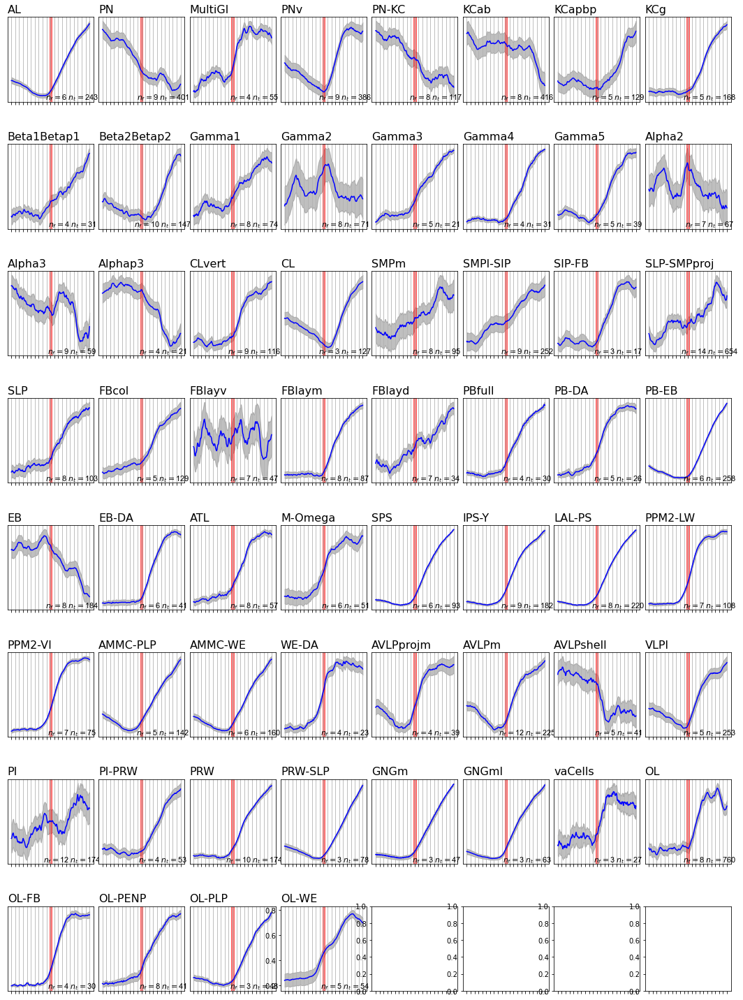

In [87]:
fig, axs = plt.subplots(8, 8,figsize=(15,20),sharex=True)
l=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)

    if sum(Trials[:,j])>3 and len(np.unique(FlyIDTrials[Condition1,j]))>=3:
        #C=CompCorron200Trials[:,j,:]
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        C0=CompCorron200Trialn[:,j,:]
        C=C0[Condition1,:]
        err=np.nanstd(C,axis=0)/np.sqrt(C.shape[0]-1)
        #err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(FlyIDTrials[Condition1,j]))-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(C,axis=0),color='b')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmean(C,axis=0)-err,err+np.nanmean(C,axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_f=$'+str(len(np.unique(FlyIDTrials[Condition1,j])))+' $n_t=$'+ str(C.shape[0]), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-3, 100+3, alpha=0.5, color='r')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        if j!=len(CompOrder)-1:
            axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
            axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
            
            for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
                tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('C://Users//Soso//Desktop/FlyStuff/Aimon2022\\AllComponentsTrialsAv30Hz_and_more_1sbeforeOnsemtrials.svg')
plt.savefig('C:\\Users\\Soso\\Desktop\\FlyStuff/Aimon2022\\AllComponentsTrialsAv30Hz_and_more_1sbeforeOnsemtrials.png')
plt.show() 


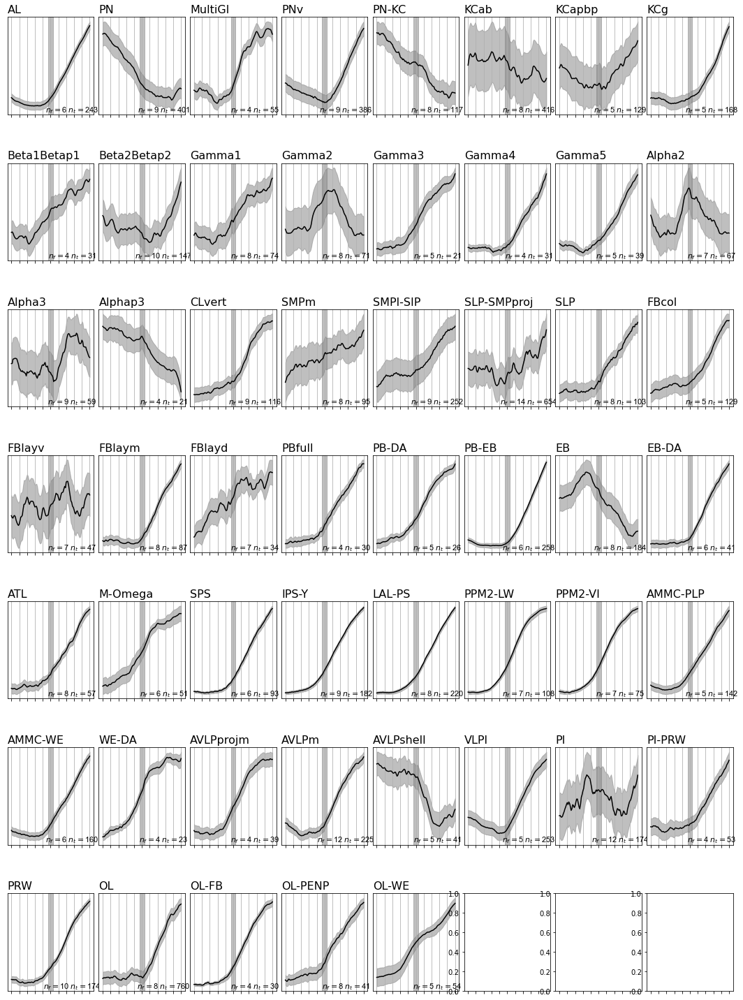

In [45]:
fig, axs = plt.subplots(7, 8,figsize=(15,20),sharex=True)
l=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)

    if sum(Trials[:,j])>3 and len(np.unique(FlyIDTrials[Condition1,j]))>3:
        #C=CompCorron200Trials[:,j,:]
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        C0=CompCorron200Trialn[:,j,50:151]
        C=C0[Condition1,:]
        #err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(FlyIDTrials[Condition1,j]))-1))
        err=np.abs(np.nanstd(C,axis=0)/np.sqrt(C.shape[0]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(C,axis=0),color='black')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(101),np.nanmean(C,axis=0)-err,err+np.nanmean(C,axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_f=$'+str(len(np.unique(FlyIDTrials[Condition1,j])))+' $n_t=$'+ str(C.shape[0]), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(50-3, 50+3, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\AllComponentsTrialsAv30Hz_and_more_500msbeforeOnset_semtrials.svg')
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\AllComponentsTrialsAv30Hz_and_more_500msbeforeOnset_semtrials.png')
plt.show() 


In [ ]:
fig, axs = plt.subplots(7, 8,figsize=(15,20),sharex=True)
l=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)

    if sum(Trials[:,j])>3 and len(np.unique(FlyIDTrials[Condition1,j]))>3:
        #C=CompCorron200Trials[:,j,:]
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        C0=CompCorron200Trialn[:,j,50:151]
        C=C0[Condition1,:]
        #err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(FlyIDTrials[Condition1,j]))-1))
        err=np.abs(np.nanstd(C,axis=0)/np.sqrt(C.shape[0]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(C,axis=0),color='black')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(101),np.nanmean(C,axis=0)-err,err+np.nanmean(C,axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_f=$'+str(len(np.unique(FlyIDTrials[Condition1,j])))+' $n_t=$'+ str(C.shape[0]), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(50-3, 50+3, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\AllComponentsTrialsAv30Hz_and_more_2sbefore.svg')
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\AllComponentsTrialsAv30Hz_and_more_2sbefore.png')
plt.show() 


In [93]:
ForcedCompCorron200Trialn=np.load('C://Users/Soso/Desktop/FlyStuff/Aimon2022\Fig6Data\Forced200Trialn.npy')

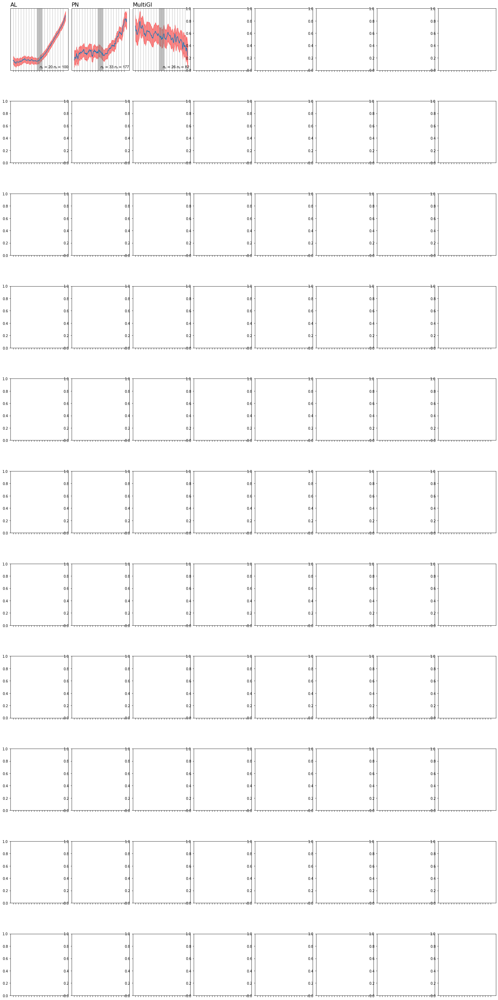

In [94]:
fig, axs = plt.subplots(11, 8,figsize=(20,40),sharex=True)
l=0
#for j in range(len(CompOrder)):
for j in range(3):
    if sum(ForcedTrials[:,j])>3 and ForcednFlies[j]>3:       
        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.abs(np.nanstd(ForcedCompCorron200Trialn[:,j,:],axis=0)/np.sqrt(ForcednFlies[j]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0),color='red',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(ForcednFlies[j]))+' $n_t=$'+ str(int(sum(ForcedTrials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-10, 100+10, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeForced.svg')
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeForced.png')
plt.show() 


In [ ]:
fig, axs = plt.subplots(11, 8,figsize=(20,40),sharex=True)
l=0
#for j in range(len(CompOrder)):
for j in range(3):
    if sum(ForcedTrials[:,j])>3 and ForcednFlies[j]>3:       
        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.abs(np.nanstd(ForcedCompCorron200Trialn[:,j,:],axis=0)/np.sqrt(ForcednFlies[j]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0),color='red',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(ForcednFlies[j]))+' $n_t=$'+ str(int(sum(ForcedTrials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-10, 100+10, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeForced.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeForced.png')
plt.show() 


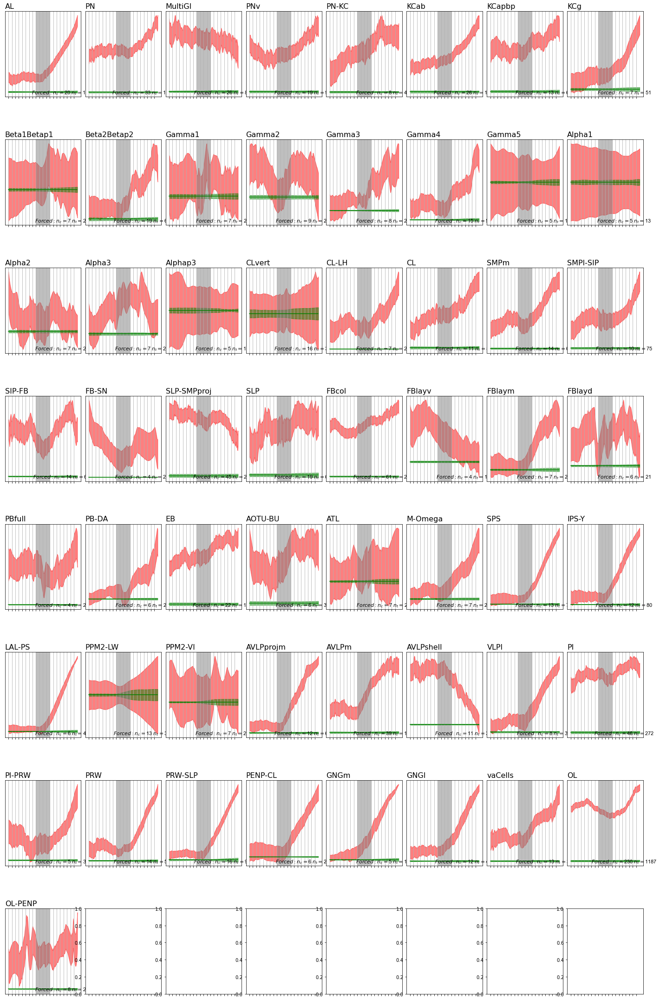

In [95]:
fig, axs = plt.subplots(8, 8,figsize=(20,30),sharex=True)
l=0
for j in range(len(CompOrder)):
    if sum(Trials[:,j])>3 and nFlies[j]>3 and sum(ForcedTrials[:,j])>3 and ForcednFlies[j]>3:       
        FC=np.nanmedian(ForcedCompCorron200Trialn[:,j,:])
                #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.abs(np.nanstd(ForcedCompCorron200Trialn[:,j,:],axis=0)/np.sqrt(ForcednFlies[j]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(FC,'r')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(ForcedCompCorron200Trialn[:,j,:],axis=0),color='red',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$Forced: n_c=$'+str(int(ForcednFlies[j]))+' $n_t=$'+ str(int(sum(ForcedTrials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(nFlies[j]-1)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(CompCorron200Trialn[:,j,:],axis=0),'g')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(CompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(CompCorron200Trialn[:,j,:],axis=0),color='green',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
      #  axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(nFlies[j]))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronForcedandSpontComponentsTrialsMed_AllFreq_1sbefore.svg')
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronForcedandSpontComponentsTrialsMed_AllFreq_1sbefore.png')
plt.show() 


In [89]:
hf = h5py.File('C://Users/Soso/Desktop/FlyStuff/Aimon2022\Fig6Data\ForcedTrials2spre.h5', 'r')
ForcedCompCorron200=hf.get('CompCorron200')[:]
ForcedCompCorroff200=hf.get('CompCorroff200')[:]
ForcedCompCorronoff200=hf.get('CompCorronoff200')[:]
Forcedkall=hf.get('kall')[()]
ForcedTrials=hf.get('Trials')[:]
ForcedCompCorron200Trials=hf.get('CompCorron200Trials')[:]
ForcednFlies=hf.get('NComponents')[:]
ForcedFRTrials=hf.get('FRTrials')[:]
ForcedGAL4Trials=hf.get('GAL4Trials')[:]
ForcedUASTrials=hf.get('UASTrials')[:]
ForcedFlyIDTrials=hf.get('FlyIDTrials')[:]
hf.close()

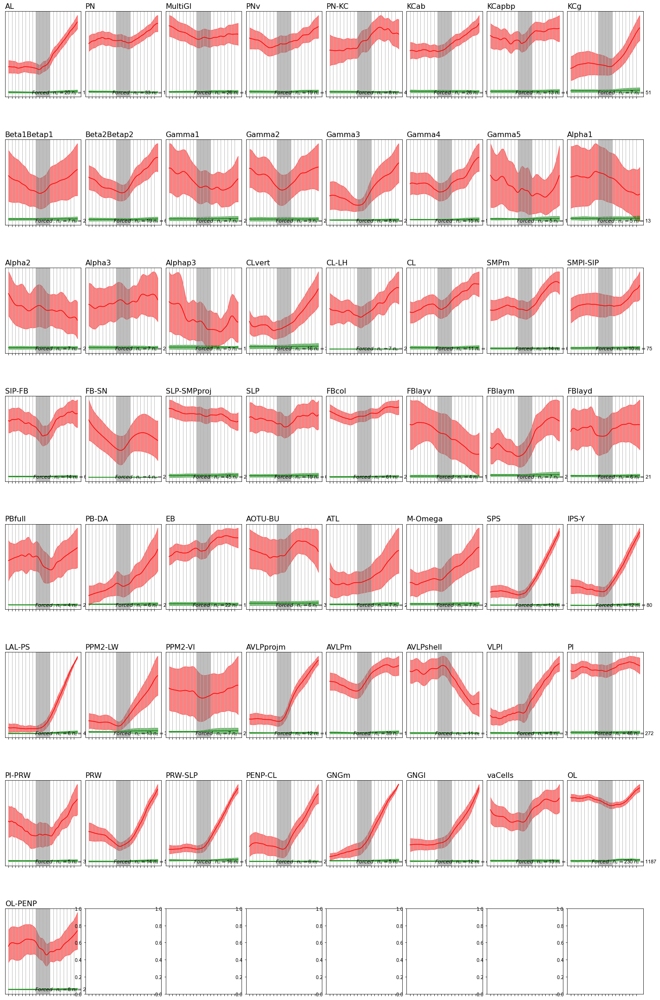

In [96]:
fig, axs = plt.subplots(8, 8,figsize=(20,30),sharex=True)
l=0
for j in range(len(CompOrder)):
    if sum(Trials[:,j])>3 and nFlies[j]>3 and sum(ForcedTrials[:,j])>3 and ForcednFlies[j]>3:       
        
                #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.abs(np.nanstd(ForcedCompCorron200Trialn[:,j,:],axis=0)/np.sqrt(ForcednFlies[j]-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(ForcedCompCorron200Trialn[:,j,:],axis=0),'r')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmean(ForcedCompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(ForcedCompCorron200Trialn[:,j,:],axis=0),color='red',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$Forced: n_c=$'+str(int(ForcednFlies[j]))+' $n_t=$'+ str(int(sum(ForcedTrials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(nFlies[j]-1)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(CompCorron200Trialn[:,j,:],axis=0),'g')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmean(CompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(CompCorron200Trialn[:,j,:],axis=0),color='green',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
      #  axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(nFlies[j]))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('Fig6CorronForcedandSpontComponentsTrialsAv_AllFreq_1sbefore.svg')
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronForcedandSpontComponentsTrialsAv_AllFreq_1sbefore.png')
plt.show() 


In [ ]:
# Plot all flies

ForcedCompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
for j in range(len(CompOrder)):
#for j in range(11,15):
    for i in range(GoodICFiles.shape[0]):
        if (np.nanmax(ForcedCompCorron200[i,j,:])-np.nanmin(ForcedCompCorron200[i,j,:]))!=0:
            #print(GoodICFiles.iloc[i]['expID'])
            ForcedCompCorrOn[j,:]=ForcedCompCorrOn[j,:]+ForcedTrials[i,j]*(ForcedCompCorron200[i,j,:]-np.nanmin(ForcedCompCorron200[i,j,:]))/(np.nanmax(ForcedCompCorron200[i,j,:])-np.nanmin(ForcedCompCorron200[i,j,:]))
           # CompCorron200n[i,j,:]=Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
            #FRs[i,j]=GoodICFiles.iloc[i]['FR']
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:])))
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

# Correlation binary components

In [184]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")

GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

In [9]:
#Regionsdf=Regionsdf.query('FR>20')
#Compdf=Compdf.query('FR>20')
#GoodICFiles=GoodICFiles.query('FR>20')

In [10]:
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [11]:
len(CompOrder)

89

In [12]:
GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimWalk']=4999
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==167,'TSlowlimWalk']=1000
GoodICFiles.loc[GoodICFiles.index==167,'TShighlimWalk']=2000
GoodICFiles.loc[GoodICFiles.index==167,'FR']=100
GoodICFiles.loc[GoodICFiles.index==168,'FR']=100

In [93]:
#for i in range(245,GoodICFiles.shape[0]):
for i in range(168,169):
   # try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print(Regressor.shape[0])             
            
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rwalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('WalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('kd',''))['Rbin']

            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            
            
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]               

 
            
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]      
                
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print(Regressor.shape[0])                  
                

            FR=GoodICFiles.iloc[i]['FR']
            print(FR)
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                print(GoodICFiles.iloc[i]['expID'])

                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.4):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.4):
                        Roff[m+1]=1                    


                savemat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'),{"Ron": Ron, "Roff": Roff})


   # except:
      #   continue   
                    # Regress here, cross corr...

/media/NAS/Sophie/WalkProject/TH/100411/100411seriesdffkf240Smith0_4_60TS.mat
6262
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100411\100411Rbinkd.mat
6262
/media/NAS/Sophie/WalkProject/TH/100411/100411seriesdffkf240Smith0_4_60TS.mat
6262
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\100411\100411Rbinkd.mat
6262
100.0
100411


In [78]:
i

270

In [9]:
# too noisy, identify onset by hand
Ron =np.zeros((5998,1))
Roff =np.zeros((5998,1))
Ron[211]=1
Ron[923]=1
Ron[2726]=1
Ron[3505]=1
Ron[5647]=1
savemat(GoodICFiles[GoodICFiles['expID']=='107']['WalkRegressor'].values.tolist()[0].replace('.mat','Ron_and_Roff.mat'),{"Ron": Ron.T, "Roff": Roff.T})

In [ ]:
CompCorronoff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorroff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200Time=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
Compdf['OnTime']=np.nan


In [ ]:
CompCorron200Trials=np.zeros((100000,len(CompOrder),201))
CompCorron200Trials[:,:,:]=np.nan
xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(300)
Trials=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
nFlies=np.zeros(300)
kall=0

In [ ]:
#for i in range(164,GoodICFiles.shape[0]):
for i in range(GoodICFiles.shape[0]):
#for i in range(169,180):
    try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
 
            Ron =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'))['Ron'].T
            Roff =loadmat(GoodICFiles.iloc[i]['WalkRegressor'].replace('.mat','Ron_and_Roff.mat'))['Roff'].T
            Regressor=Ron
            
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]               

            Ron=Regressor
            FR=GoodICFiles.iloc[i]['FR']
            #if len(TS)!=1 and pd.isnull(FR)==False:
           # if len(TS)!=1:
            print(GoodICFiles.iloc[i]['expID'])
            #print(TS.shape)
            
            for j in range(TS.shape[0]):
                                
                if len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID']))!=0:
                    RegName=list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])[0]
                                                            
                        
                    #if (np.isnan(np.mean(TS[j,:]))==False) and (CompOrder[CompOrder[0]==RegName].empty == False):
                    if (CompOrder[CompOrder[0]==RegName].empty == False):                        
                        #print(RegName)
#                         ## Full correlation
#                             TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
#                             Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)

                        ## Onset correlation
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T),'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')      

                        ## fit onset to get onset time
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        #p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)                            
                        #Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),'OnTime']=p[0]
                       #CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+p[0]

                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR)+1]
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            CompCorron200Trials[int(kall)+l,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=Tlocint(xnew)
                        #k[list(CompOrder[CompOrder[0]==RegName].index)[0]]= k[list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)
                        Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=sum(Ron)   
                        nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]=nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]+1

                        if j==0:
                            plt.plot(x,Corrloc)
                           # plt.axvline(x=p[0])
                           # xd = np.linspace(-1, 1, 100)
                           # plt.plot(xd, piecewise_linear(xd, *p))
                            plt.show()   

#                         ## Offset correlation
#                             Corr=np.correlate(TS[j,:],np.squeeze(Roff.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorroff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorroff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)
                kall=kall+sum(Ron)
            del TS


    except:
         continue   
                    # Regress here, cross corr...

In [ ]:
np.save('CompnFliesAllFreq.npy',nFlies)

In [ ]:
np.save('CompCorronAllFreq.npy',CompCorron200)
np.save('CompCorroffAllFreq.npy',CompCorroff200)
np.save('CompCorronoffAllFreq.npy',CompCorronoff200)
np.save('CompKsAllFreq.npy',k)
np.save('CompTrialsAllFreq.npy',Trials)
np.save('CompCorronTrialsAllFreq.npy',CompCorron200Trials)


In [16]:
#CompCorron200=np.load('ICCorron200_sup20Hz.npy')
#CompCorroff200=np.load('ICCorroff200_sup20Hz.npy')
#CompCorronoff200=np.load('ICCorronoff200_sup20Hz.npy')

# Plot all onsets individually

In [28]:
CompCorron200=np.load('CompCorronAllFreq.npy')
Trials=np.load('CompTrialsAllFreq.npy')
CompCorron200Trials=np.load('CompCorronTrialsAllFreq.npy')
k=np.load('CompKsAllFreq.npy')
nFlies=np.load('CompnFliesAllFreq.npy')

In [ ]:
nFlies

In [10]:
kall=100000

In [ ]:
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [13]:
CompCorron200n=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
FRs=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [14]:
CompCorron200[np.isnan(CompCorron200)]=0

In [15]:
CompCorron200Trials.shape

(100000, 89, 201)

In [16]:
CompCorron200Trialn=np.zeros((CompCorron200Trials.shape))

89


IndexError: index 89 is out of bounds for axis 1 with size 89

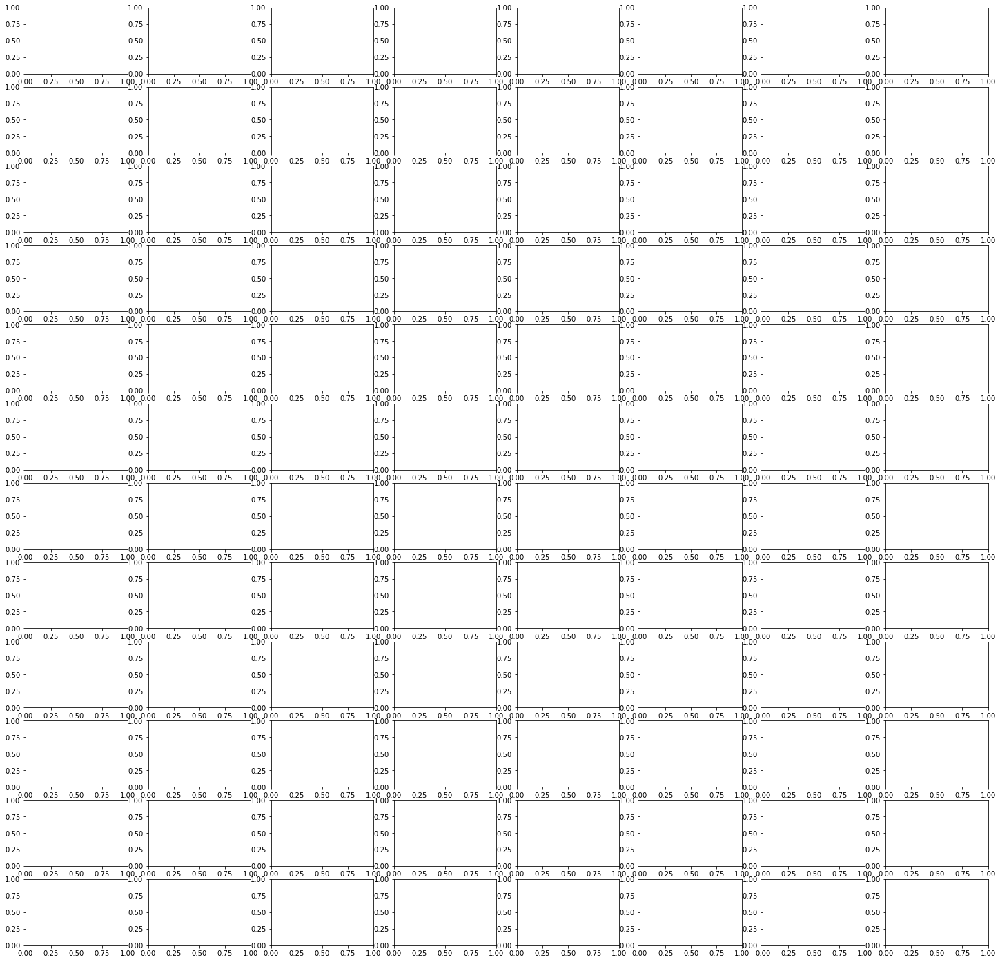

In [55]:
# Plot all trials
CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
j=0
#for l in range(len(CompOrder)):
for l in range(89):
    print(l)
    if sum(Trials[:,l])>1:
        for k in range(100000):
            C=CompCorron200Trials[k,l,:]
            if (np.nanmax(C)-np.nanmin(C))!=0:
                CompCorron200Trialn[k,l,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(CompCorron200Trialn[k,l,:],alpha=0.01,color='black')
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][l]) 
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvspan(100-10, 100+10, alpha=0.5, color='grey')
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)

        j=j+1
#    except:
  #       continue   
plt.tight_layout()
#plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials_AllFreq_1sbeforeOlfSS.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials_AllFreq_1sbefore.png')
plt.show()

In [13]:
np.save('CompCorron200Trialn_AllFreq.npy',CompCorron200Trialn)

NameError: name 'CompCorron200Trialn' is not defined

In [18]:
CompCorron200Trialn=np.load('CompCorron200Trialn_AllFreq.npy')

In [46]:
Cnonnan=CompCorron200Trialn[:,17,:]
Cnonnan2=Cnonnan[~np.isnan(Cnonnan).any(axis=1),:]
for n in range(Cnonnan2.shape[0]):
    Cnonnan2[n,:]=Cnonnan2[n,:]-np.mean(Cnonnan2[n,:])
kmeans2 = KMeans(n_clusters=3, random_state=1).fit(Cnonnan2)


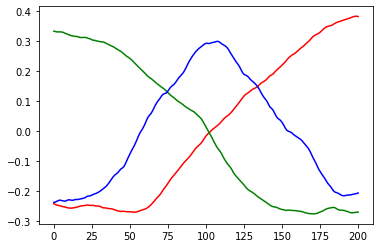

In [47]:
plt.plot(Cnonnan2[kmeans2.labels_==0,:].mean(axis=0),'r')
plt.plot(Cnonnan2[kmeans2.labels_==1,:].mean(axis=0),'g')
plt.plot(Cnonnan2[kmeans2.labels_==2,:].mean(axis=0),'b')
#plt.plot(Cnonnan2[kmeans2.labels_==3,:].mean(axis=0),'c')

In [10]:
nFlies

NameError: name 'nFlies' is not defined

# Plot trial average

In [ ]:
CompCorron200=np.load('CompCorronAllFreq.npy')
Trials=np.load('CompTrialsAllFreq.npy')
CompCorron200Trials=np.load('CompCorronTrialsAllFreq.npy')
k=np.load('CompKsAllFreq.npy')
nFlies=np.load('CompnFliesAllFreq.npy')

In [ ]:
CompCorron200Trialn=np.load('CompCorron200Trialn_AllFreq.npy')

In [13]:
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

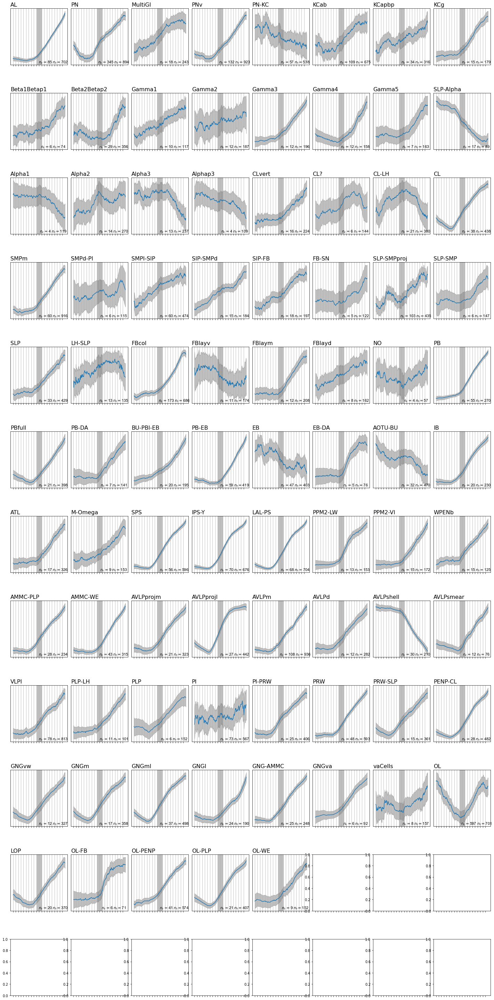

In [24]:
fig, axs = plt.subplots(11, 8,figsize=(20,40),sharex=True)
l=0
for j in range(len(CompOrder)):
    if sum(Trials[:,j])>3 and nFlies[j]>3:       
        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(nFlies[j]-1)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(CompCorron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(CompCorron200Trialn[:,j,:],axis=0)-err,err+np.nanmedian(CompCorron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(nFlies[j]))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-10, 100+10, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbefore.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbefore.png')
plt.show() 


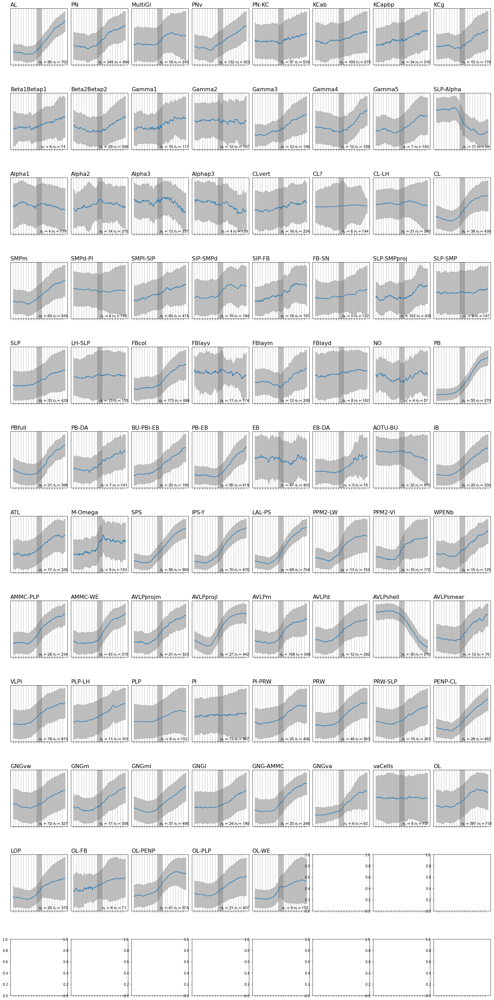

In [37]:
fig, axs = plt.subplots(12, 8,figsize=(20,40),sharex=True)
l=0
for j in range(len(CompOrder)):
    if sum(Trials[:,j])>3 and nFlies[j]>3:       
        #err=np.nanstd(CompCorron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        err=np.nanstd(CompCorron200Trials[:,j,:],axis=0)/np.sqrt(nFlies[j]-1)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmedian(CompCorron200Trials[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmedian(CompCorron200Trials[:,j,:],axis=0)-err,err+np.nanmedian(CompCorron200Trials[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_c=$'+str(int(nFlies[j]))+' $n_t=$'+ str(int(sum(Trials[:,j]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-10, 100+10, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeNotNorm.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponentsTrialsMed_AllFreq_1sbeforeNotNorm.png')
plt.show() 


In [16]:
CompCorron200Trialn.shape

(100000, 89, 201)

In [18]:
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")


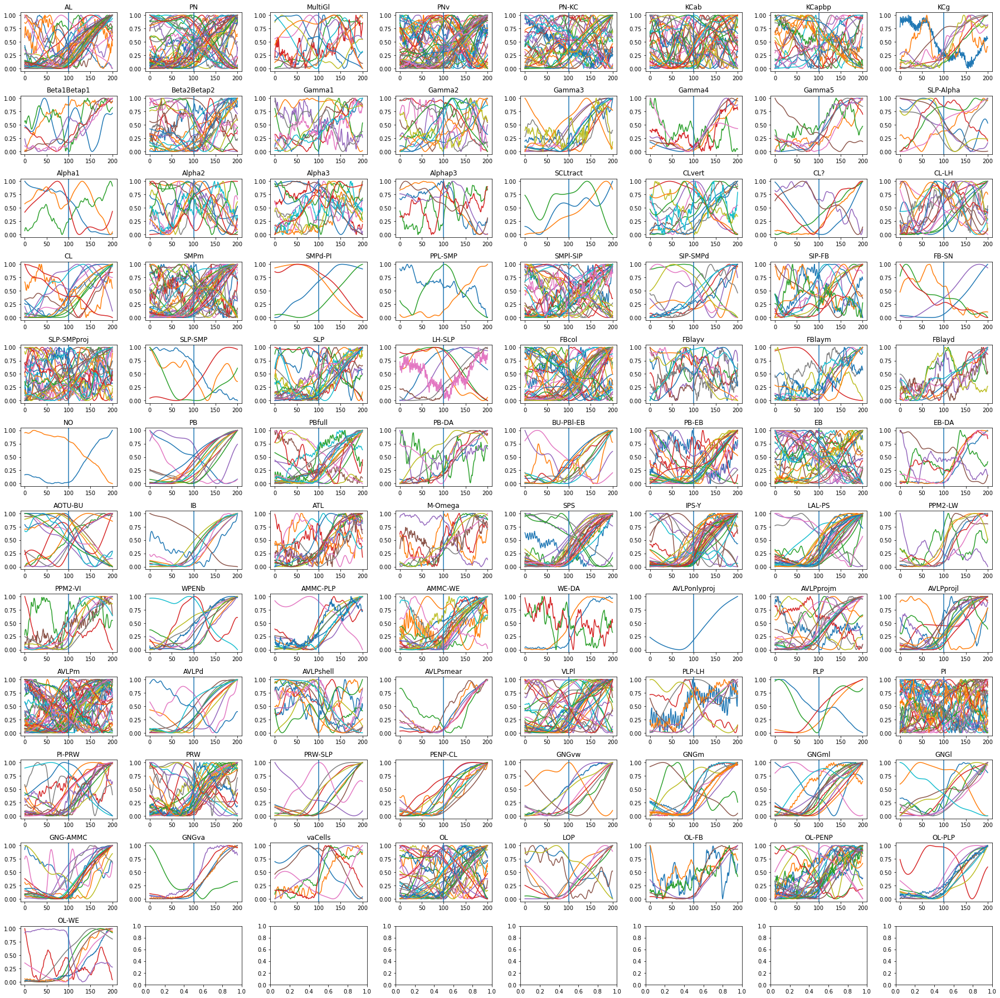

In [21]:
# Plot all flies

CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
for j in range(len(CompOrder)):
#for j in range(11,15):
    for i in range(GoodICFiles.shape[0]):
        if (np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))!=0:
            #print(GoodICFiles.iloc[i]['expID'])
            CompCorrOn[j,:]=CompCorrOn[j,:]+Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
           # CompCorron200n[i,j,:]=Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
            #FRs[i,j]=GoodICFiles.iloc[i]['FR']
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:])))
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

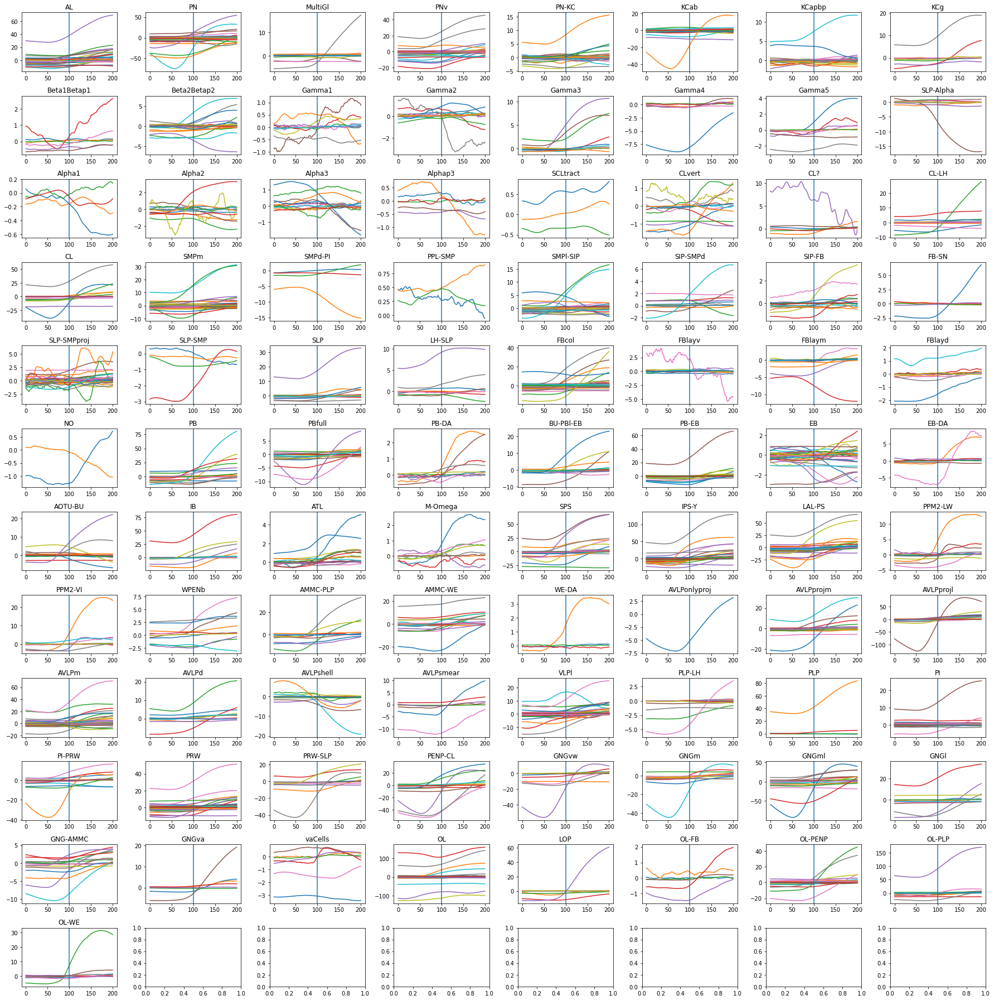

In [43]:
# Plot all flies
# Plot all flies

CompCorrOn=np.zeros((len(CompOrder),201))
fig, axs = plt.subplots(12, 8,figsize=(25,25))
for j in range(len(CompOrder)):
#for j in range(11,15):
    for i in range(GoodICFiles.shape[0]):
        if (np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))!=0:
            #print(GoodICFiles.iloc[i]['expID'])
            #CompCorrOn[j,:]=CompCorrOn[j,:]+Trials[i,j]*CompCorron200[i,j,:])
           # CompCorron200n[i,j,:]=Trials[i,j]*(CompCorron200[i,j,:]-np.nanmin(CompCorron200[i,j,:]))/(np.nanmax(CompCorron200[i,j,:])-np.nanmin(CompCorron200[i,j,:]))
            #FRs[i,j]=GoodICFiles.iloc[i]['FR']
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(CompCorron200[i,j,:])
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [33]:
Trials.shape

(271, 89)

In [54]:
CompCorrOnOff=np.zeros((len(CompOrder),201))
for i in range(GoodICFiles.shape[0]):
    for j in range(len(CompOrder)):
        CompCorrOnOff[j,:]=CompCorrOnOff[j,:]+CompCorronoff200[i,j,:]
#    except:
  #       continue      

In [55]:
CompCorrOff=np.zeros((len(CompOrder),201))
for i in range(GoodICFiles.shape[0]):
    for j in range(len(CompOrder)):
        CompCorrOff[j,:]=CompCorrOff[j,:]+CompCorroff200[i,j,:]
#    except:
  #       continue      

In [56]:
CompCorron200n[CompCorron200n==0]=np.nan

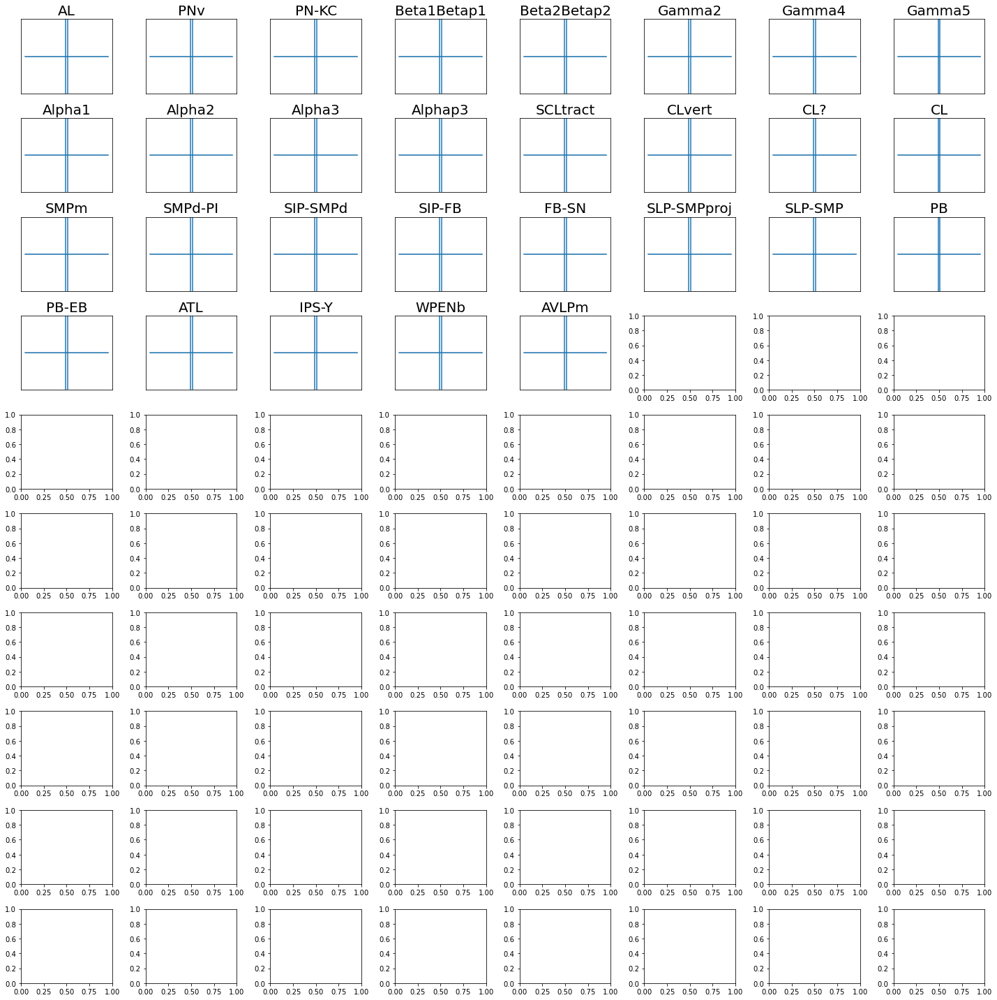

In [35]:
fig, axs = plt.subplots(10, 8,figsize=(20,20))
j=0
for l in range(len(CompOrder)):
    if np.sum(Trials[l,:])>=4:
        err=np.nanstd(CompCorron200n[:,l,:],axis=0)/np.sqrt(np.sum(Trials[l,:])-1)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,l,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][l],fontsize=20) 
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100-2.5)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100+2.5)        
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(201),np.nanmean(CompCorron200n[:,l,:],axis=0)-err,err+np.nanmean(CompCorron200n[:,l,:],axis=0),color='grey',
                     alpha=0.5)  
        
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
        j=j+1
    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\WalkProject\Figures\Figure6\Fig6CorronComponents_sup20Hz.svg')
plt.show()  

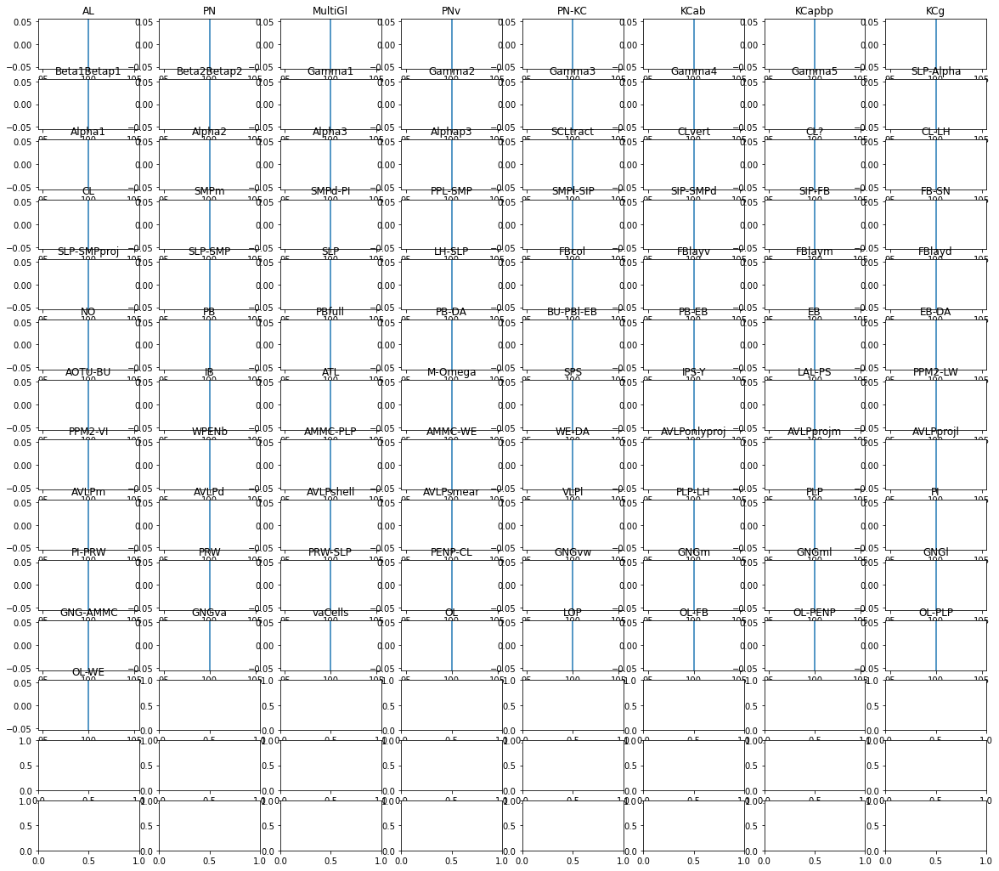

In [58]:
fig, axs = plt.subplots(14,8,figsize=(20,18))
for j in range(len(CompOrder)):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(CompCorrOff[j,:]/np.nanmax(CompCorrOff[j,:]))
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(CompOrder[0][j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
plt.show()  

# Histogram of onset time compared to onset time GNG

# PCA onset times

Are there different types of activity when starting to walk?

In [178]:
CompOrder[0][1]

'PN'

In [325]:
for j in range(20):
    print(j,CompOrder[0][j])

0 AL
1 PN
2 MultiGl
3 PNv
4 PN-KC
5 KCab
6 KCapbp
7 KCg
8 Beta1Betap1
9 Beta2Betap2
10 Gamma1
11 Gamma2
12 Gamma3
13 Gamma4
14 Gamma5
15 SLP-Alpha
16 Alpha1
17 Alpha2
18 Alpha3
19 Alphap3


In [59]:
CompCorron200Trialn.shape

(300, 89, 101)

In [341]:
A=CompCorron200Trialn[:,12,:]-0.5
A=A[np.isnan(np.nanmean(A,1))==False]

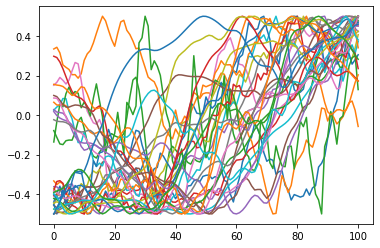

In [342]:
plt.plot(A.T)

In [60]:
u, s, vh = np.linalg.svd(A)

LinAlgError: SVD did not converge

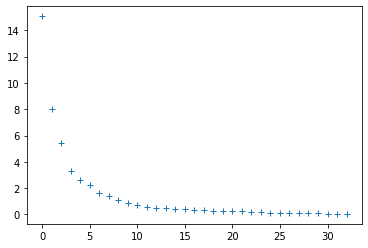

In [344]:
plt.plot(s,'+')

In [345]:
np.mean(u[:,1])

0.00156867235144059

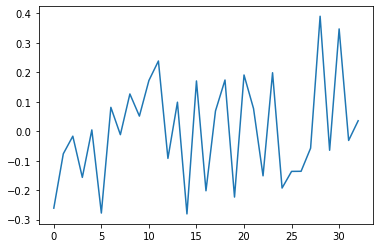

In [346]:
plt.plot(u[:,1])

In [347]:
s[2]

5.463955433570459

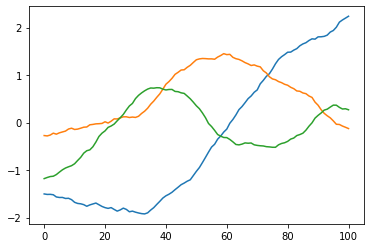

In [348]:
#plt.plot(s[0]*vh[0,:])
plt.plot(np.sign(np.mean(u[:,0]))*s[0]*vh[0,:])
plt.plot(np.sign(np.mean(u[:,1]))*s[1]*vh[1,:])
plt.plot(np.sign(np.mean(u[:,2]))*s[2]*vh[2,:])
#plt.plot(np.sign(np.mean(u[:,3]))*s[3]*vh[3,:])
#plt.plot(np.sign(np.mean(u[:,4]))*s[4]*vh[5,:])

In [349]:
CompCorron200Trials[:,1,50:151]

array([[-0.01000306, -0.01122026, -0.01037726, ..., -0.00510383,
        -0.00698053, -0.00700571],
       [-0.40603333, -0.41356254, -0.41574235, ..., -0.19827851,
        -0.20479335, -0.21846537],
       [ 0.01994106,  0.0195851 ,  0.01851728, ...,  0.01701752,
         0.01339361,  0.00910399],
       ...,
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan]])

 ...]

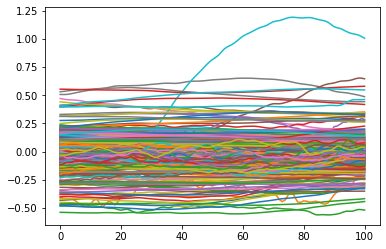

In [350]:
plt.plot(CompCorron200Trials[:,1,50:151].T)

In [351]:
# k-means

In [62]:
from sklearn.cluster import KMeans, DBSCAN, AffinityPropagation

In [64]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(CompCorron200Trialn[:,1,:])
plt.plot(kmeans.cluster_centers_.T)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [374]:
dbscan =DBSCAN(eps=0.000001).fit(A)
dbscan.components_

In [381]:
afprop =AffinityPropagation(random_state=2).fit(A)

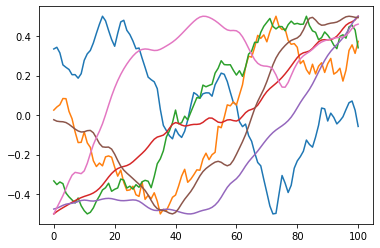

In [382]:
plt.plot(afprop.cluster_centers_.T)


In [363]:
np.mean(kmeans.labels_)

1.5454545454545454

## Correlation convolved components

In [ ]:
Corr200Comp=np.zeros((GoodICFiles.shape[0],len(CompOrder),200))

In [ ]:
xnew = np.linspace(-1, 1, num=200, endpoint=True)

for i in range(GoodICFiles.shape[0]):
   # try:
        if GoodICFiles.iloc[i]['WalkRegressor'] != '':

            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']

            Regressor=loadmat(GoodICFiles.iloc[i]['WalkRegressor'])['Rkd']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]    
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                  
            if TS.shape[1]==(Regressor.shape[0]+6):
                TS=TS[:,3:TS.shape[1]-3]   
            if TS.shape[1]==(Regressor.shape[0]-11):
                Regressor=Regressor[5:Regressor.shape[0]-6]  
            if TS.shape[1]<Regressor.shape[0]:    
                Regressor=Regressor[int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]     
            if TS.shape[1]>Regressor.shape[0]:    
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]
           
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]    
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 

            FR=GoodICFiles.iloc[i]['FR']
            if len(TS)!=1:
                            #get onset
               
                    
                    
                for j in range(len(TS)):
                    
                #for j in range(2):      
                    if np.isnan(np.mean(TS[j,:]))==False:
                        RegName=Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),['CompID']]
                        
                        Corr=scipy.signal.correlate(TS[j,:],np.squeeze(Regressor.T))
                        Corrloc=Corr[int((len(Corr+1)/2)-FR):int((len(Corr+1)/2)+FR+1)]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corr200Comp[i,CompOrder.index(RegName),:]=Corr200Comp[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        
                        
                del TS
                
   # except:
    #     continue   
                    # Regress here, cross corr...

In [ ]:
np.save('CompCorrCov.npy',Corr200Conv)